##                                Importing the Dependies

<img src= "CardiacPictureTeam1Pycharmers.jpg" width=500, height=500>

In [1]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [3]:
! pip install -U pandasql

ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/Users/mr2131/opt/anaconda3/lib/python3.9/site-packages/SQLAlchemy-1.4.32.dist-info/METADATA'



In [4]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install pywaffle

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install qbstyles

Note: you may need to restart the kernel to use updated packages.


In [7]:
import pandas as pd
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import qbstyles 
from qbstyles import mpl_style
import missingno as msno
from pywaffle import Waffle
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import re
from datetime import datetime, timedelta
%matplotlib inline

## Data Collection and Processing

In [9]:
df_Responsivenes=pd.read_excel('Cardiac_Outcomes.xlsx', sheet_name='Responsivenes')
df_Hospitalization_Discharge = pd.read_excel("Cardiac_Outcomes.xlsx",sheet_name = "Hospitalization_Discharge")
df_CardiacComplications = pd.read_excel("Cardiac_Outcomes.xlsx",sheet_name = "CardiacComplications")
df_PatientHistory = pd.read_excel('Cardiac_Outcomes.xlsx',sheet_name = "PatientHistory")
df_Labs = pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name ="Labs")
df_Demography = pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name = "Demography")
df_Patient_Prescriptions = pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name = "Patient_Precriptions")

## Question1 How many patients were registered in each unique occupation?

In [9]:
df_Demography.groupby('occupation').size()

occupation
Officer             7
Others             89
UrbanResident    1670
farmer            198
worker             17
dtype: int64

## Question2 Divide GCS scores into slabs of 5 and count the number of patients under each band of score. Show this as any graph of your choice

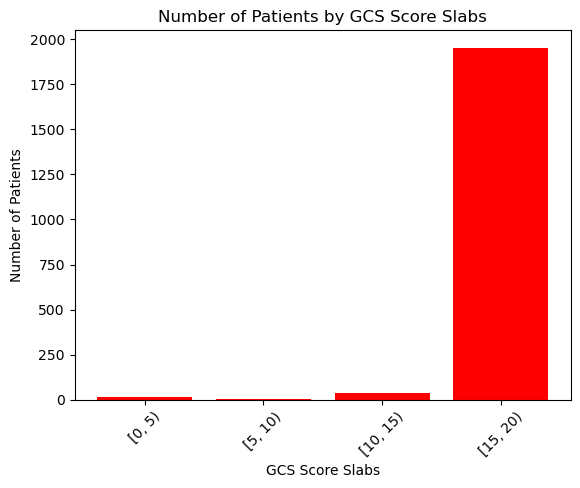

In [10]:
import pandas as pd
import matplotlib.pyplot as plt


slabs = range(0, 21, 5)


# Create bins for the GCS scores
bins = pd.cut(df_Responsivenes['GCS'], bins=slabs, right=False, include_lowest=True)

# Count the number of patients falling within each slab
counts = bins.value_counts(sort=False)

# Plot the counts as a bar graph
plt.bar(counts.index.astype(str),counts.values,color='red')
plt.title('Number of Patients by GCS Score Slabs')
plt.xlabel('GCS Score Slabs')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45)
##plt.tight_layout()
plt.show()

## Question3  Add a calculated column called Discharge date into the Hospitalization_Discharge using the information already available to you

In [11]:
# Question no.3 Add a calculated column called Discharge date into the Hospitalization_Discharge using the information already available to you?
# Convert "Admission date" to datetime
df_Hospitalization_Discharge['Admission date'] = pd.to_datetime(df_Hospitalization_Discharge['Admission_date'])
# Add calculated column "Discharge date" by adding "Discharge day" to "Admission date"
df_Hospitalization_Discharge['Discharge date'] = df_Hospitalization_Discharge['Admission_date'] + pd.to_timedelta(df_Hospitalization_Discharge['dischargeDay'], unit='D')

# Display the DataFrame
df_Hospitalization_Discharge['Discharge date']

0      2017-02-04
1      2017-05-13
2      2016-11-23
3      2017-10-13
4      2019-11-22
          ...    
2003   2016-02-12
2004   2017-04-06
2005   2018-02-05
2006   2019-11-28
2007   2017-02-23
Name: Discharge date, Length: 2008, dtype: datetime64[ns]

## Question4 What percentage of patients had Biventricular heart failure?

In [12]:
#Question no 4. Count the number of patients with biventricular heart failure
num_biventricular_failure = df_CardiacComplications['type_of_heart_failure'].str.contains('both', case=False).sum()

# Count the total number of patients
total_inpatient_number = len(df_CardiacComplications)

# Calculate the percentage
percentage_biventricular_failure = (num_biventricular_failure / total_inpatient_number) * 100

# Print the result
print(f"The percentage of patients with biventricular heart failure is: {percentage_biventricular_failure:.2f}%")

The percentage of patients with biventricular heart failure is: 73.71%


## Question5 What is the ratio of patients who were responsive to pain vs responsive to sound?

In [13]:
# question 5 What is the ratio of patients who were responsive to pain vs responsive to sound?
ResponsiveToPain_count = (df_Responsivenes['consciousness'] == 'ResponsiveToPain').sum()
# Count the number of patients responsive to sound
ResponsiveToSound_count =  (df_Responsivenes['consciousness'] == 'ResponsiveToSound').sum()
# Calculate the ratio
ratio_pain_to_sound = ResponsiveToPain_count / ResponsiveToSound_count
ratio = f"{ResponsiveToPain_count}:{ResponsiveToSound_count}"

# Print the ratio
print("Ratio of patients responsive to pain vs responsive to sound:", ratio , ratio_pain_to_sound)

Ratio of patients responsive to pain vs responsive to sound: 4:19 0.21052631578947367


## Question6 What was the average age group of the patients that had an outcome of 'Alive'?

In [14]:

df_Hospitalization_Discharge=pd.read_excel('Cardiac_Outcomes.xlsx', sheet_name='Hospitalization_Discharge')
filtered_df = df_Hospitalization_Discharge[df_Hospitalization_Discharge["outcome_during_hospitalization"].str.contains("Alive")]

#df_Demography=pd.read_excel('Cardiac_Outcomes.xlsx', sheet_name='Demography')
f = filtered_df[["inpatient_number","outcome_during_hospitalization"]].merge(df_Demography[["inpatient_number","ageCat"]],on = "inpatient_number",how = "inner") 


s = f.groupby(['outcome_during_hospitalization','ageCat']).size()
result = s.loc[s.groupby(level=0).idxmax()].reset_index().drop(0,axis=1)
print("The average age group of the patients that had more outcome of Alive are:")
print(result)

The average age group of the patients that had more outcome of Alive are:
  outcome_during_hospitalization ageCat
0                          Alive  69-79


## Question7 Visualize missing data and missing patterns from Demography table using the "MissingNo" Library.

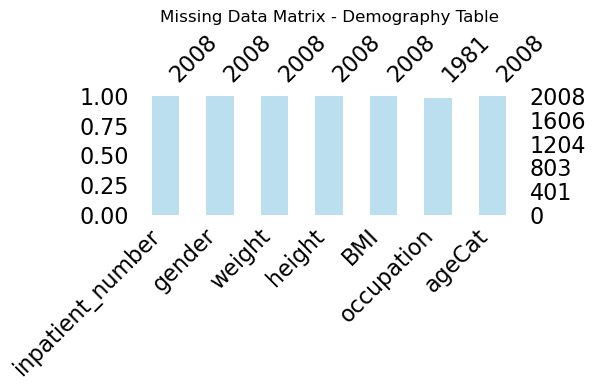

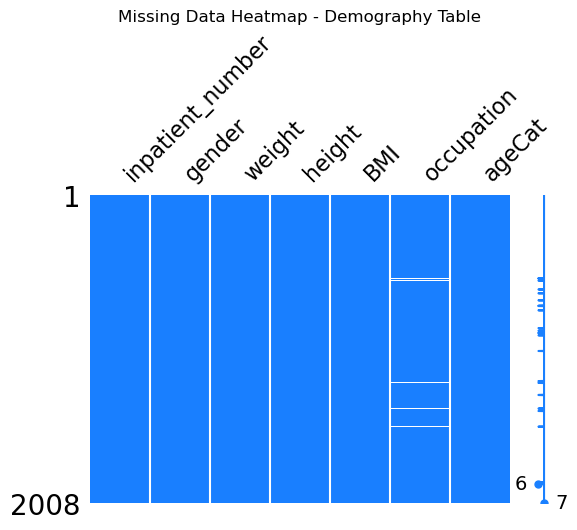

In [15]:
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt

cmap = sns.light_palette("skyblue", as_cmap=True)

# Visualize missing data patterns with a bar chart
msno.bar(df_Demography, figsize=(6, 4), color=cmap(0.5))  # Set color using the colormap
plt.title('Missing Data Matrix - Demography Table')  # Corrected title
plt.tight_layout()
plt.show()

# Visualize missing data patterns with a heatmap
msno.matrix(df_Demography, figsize=(6, 4), color=(0.1, 0.5, 1))  # Use RGB tuple for color
plt.title('Missing Data Heatmap - Demography Table')
plt.show()

## Question8 Create a Waffle chart to show what percentage of total deaths belong to each admission_ward?

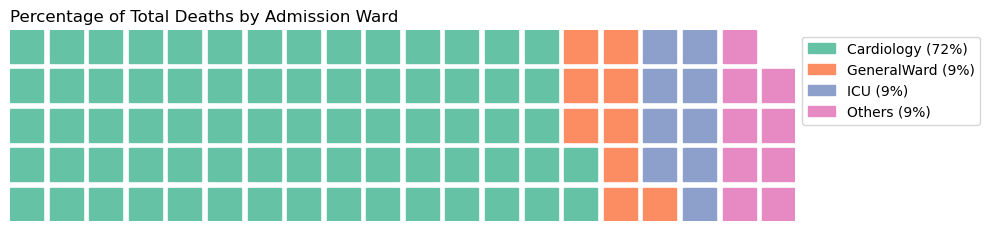

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
from pywaffle import Waffle

dead_df = df_Hospitalization_Discharge[df_Hospitalization_Discharge['outcome_during_hospitalization'].str.contains("Dead")]
death_percentage = dead_df['admission_ward'].value_counts(normalize=True) * 100

values = {
    'Cardiology': int(death_percentage.get('Cardiology', 0)),
    'GeneralWard': int(death_percentage.get('GeneralWard', 0)),
    'ICU': int(death_percentage.get('ICU', 0)),
    'Others': int(death_percentage.get('Others', 0))
}
formatted_values = {key: f"{value}%" for key, value in values.items()}

fig = plt.figure(
    FigureClass=Waffle,
    rows=5,
    values=values,
    legend={'loc': 'upper left', 'bbox_to_anchor': (1, 1), 'labels': [f"{key} ({value})" for key, value in formatted_values.items()]},
    figsize=(10, 5)
)

plt.title('Percentage of Total Deaths by Admission Ward', loc='left')
plt.show()


## Question9 Create any 2 2-D arrays and perform matrix multiplication. Display the resulting array.

In [17]:
array1 = np.array([[11, 12,1], [13, 14,2] ,[6,7,8]])
array2 = np.array([[5, 6,2], [7, 8,3],[1,2,3]])

result_array = np.dot(array1, array2)

print(result_array)

[[140 164  61]
 [165 194  74]
 [ 87 108  57]]


## Question10  Display the percentage of missing values in each column in the table labs. Show the distribution as a bar graph

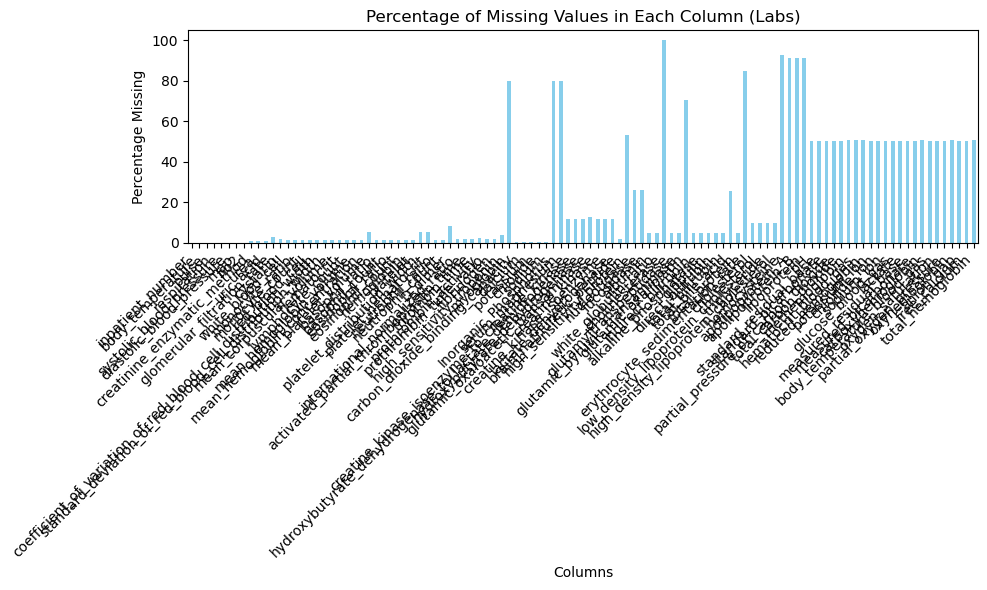

In [18]:
missing_percentages = (df_Labs.isnull().sum() / len(df_Labs)) * 100
plt.figure(figsize=(10, 6))
missing_percentages.plot(kind='bar', color='skyblue')
plt.title('Percentage of Missing Values in Each Column (Labs)')
plt.xlabel('Columns')
plt.ylabel('Percentage Missing')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Question11  A valid mobile number is a ten digit number starting with a 7,8 or 9. For every string listed, print "YES" if it is a valid
## mobile number and "NO" if it is not on separate lines. Do not print the quotes. {2,9587456281,1252478965,7397260044}

In [19]:
numbers = ['2','9587456281','1252478965','7397260044']

for number in numbers:
    if len(number) == 10 and number[0] in ['7', '8', '9'] and number.isdigit():
        print("YES")
    else:
        print("NO")

NO
YES
NO
YES


## Question12 If left ventricular end diastolic diameter has a normal range: 3.5 - 5.6 cm, how many patients fall outside that limit and what 
##is the MAP of most patients with this condition?

In [20]:
import pandas as pd
df = pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name="CardiacComplications")
df_Labs = pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name="Labs")
abnormal_diameter = df[(df['left_ventricular_end_diastolic_diameter_LV'] > 5.6) | (df['left_ventricular_end_diastolic_diameter_LV'] < 3.5)]
num_patients_outside_limit = len(abnormal_diameter)
merged_df = abnormal_diameter.merge(df_Labs, on='inpatient_number', how='inner')
most_patients_with_condition = merged_df['map'].mode()[0]
print("Number of patients with left ventricular end-diastolic diameter outside normal range:", num_patients_outside_limit)
print("MAP of most patients with this condition:", round(most_patients_with_condition, 2))

Number of patients with left ventricular end-diastolic diameter outside normal range: 1311
MAP of most patients with this condition: 96.67


## Question13 Create a bar chart between lengthofstay and body temperature, classified as: Hypothermia, within range or hyperthermia

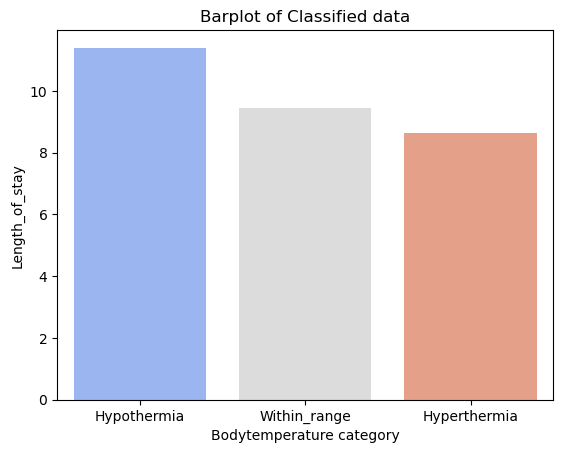

In [21]:
#df1 =  pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name="Hospitalization_Discharge")
filtered_df_Hospitalization_Discharge = df_Hospitalization_Discharge[['inpatient_number', 'dischargeDay']]

#df2 =  pd.read_excel("Cardiac_Outcomes.xlsx", sheet_name="Labs")
filtered_df_Labs = df_Labs[['inpatient_number', 'body_temperature']]

merged_df = pd.merge(filtered_df_Hospitalization_Discharge, filtered_df_Labs, on='inpatient_number')
bins=[25, 36.0, 37.5, 45]
labels = ['Hypothermia','Within_range','Hyperthermia']
merged_df['bodytemperature'] = pd.Categorical(pd.cut(merged_df['body_temperature'], 
                                                          bins=bins,
                                                          labels=labels, right=False))

category_means = merged_df.groupby('bodytemperature',observed=True)['dischargeDay'].mean().reset_index()

sns.barplot(data=category_means, x='bodytemperature', y='dischargeDay', palette='coolwarm')
plt.title('Barplot of Classified data')
plt.xlabel('Bodytemperature category')
plt.ylabel('Length_of_stay')
plt.show()

## Question14 Find the list of patients whose DischargeDay is greater than the value given by the user

In [22]:
i = int(input())
ls = []
for x in range(df_Hospitalization_Discharge.shape[0]):
    if(df_Hospitalization_Discharge['dischargeDay'][x]>i):
        ls.append(df_Hospitalization_Discharge['inpatient_number'][x])
ls

 5


[857781,
 743087,
 775928,
 823318,
 844094,
 787530,
 795420,
 807741,
 748109,
 802296,
 744167,
 780534,
 759947,
 825016,
 820101,
 729522,
 765801,
 868777,
 821261,
 814869,
 818671,
 846186,
 764380,
 861240,
 743467,
 814480,
 783621,
 848044,
 821472,
 866373,
 793147,
 739615,
 837384,
 857297,
 727376,
 865365,
 859976,
 806646,
 862491,
 858732,
 763014,
 742279,
 735209,
 736105,
 726990,
 794078,
 814928,
 793939,
 864678,
 859541,
 815319,
 738529,
 779834,
 759361,
 804640,
 778545,
 844138,
 736369,
 793801,
 866371,
 746924,
 746782,
 743908,
 791627,
 775978,
 782224,
 791903,
 817300,
 773090,
 755700,
 788057,
 850730,
 836612,
 741000,
 751159,
 842939,
 813168,
 817948,
 797752,
 828763,
 866380,
 803171,
 749183,
 796520,
 863085,
 734027,
 822474,
 789207,
 853810,
 754799,
 857432,
 800848,
 863086,
 754196,
 828662,
 804100,
 735827,
 757269,
 729949,
 787061,
 854856,
 747852,
 780824,
 860037,
 866587,
 790695,
 744861,
 759442,
 808358,
 866826,
 863869,
 

## Question15 Display a pie chart of number of patients in each category listed
## -death_within_28_days,-re_admission_within_28_days,-death_within_3_months ,
## -re_admission_within_3_months,-death_within_6_months,-re_admission_within_6_months,
## -return_to_emergency_department_within_6_months

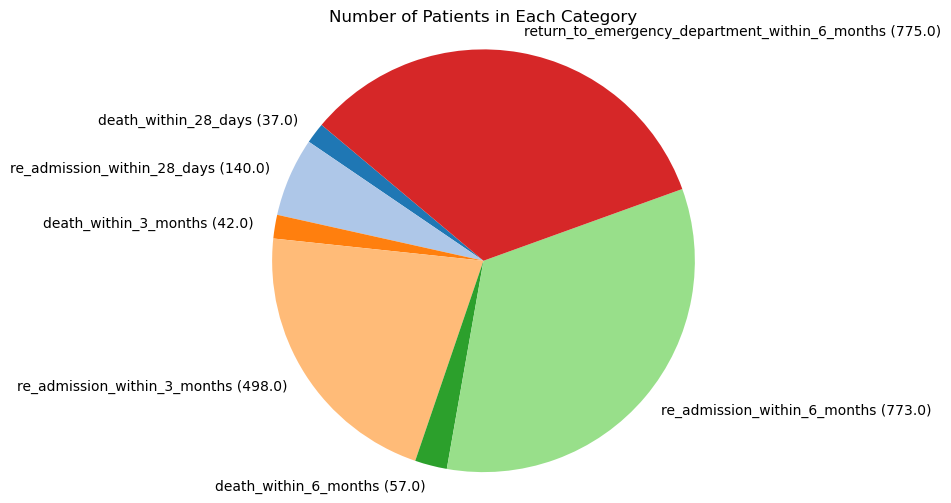

In [23]:
dfpie = df_Hospitalization_Discharge[['death_within_28_days', 're_admission_within_28_days',
                   'death_within_3_months', 're_admission_within_3_months',
                   'death_within_6_months', 're_admission_within_6_months',
                   'return_to_emergency_department_within_6_months']]
total = dfpie.sum()
colors = plt.cm.tab20.colors[:len(total)]
labels_counts = [f"{label} ({count})" for label, count in zip(total.index, total)]
plt.figure(figsize=(6, 6))
plt.pie(total, labels=labels_counts, startangle=140, colors=colors)
plt.title('Number of Patients in Each Category')
plt.axis('equal')
plt.show()


## Question16 Create a pivot table with myocardial_infarction, congestive_heart_failure,peripheral_vascular_disease as rows and average Uric Acid
## and BMI as columns, using melt functions

In [24]:
data1=df_CardiacComplications[['inpatient_number','myocardial_infarction','congestive_heart_failure','peripheral_vascular_disease']]
data2=df_Labs[['inpatient_number','uric_acid']]
data3=df_Demography[['inpatient_number','BMI']]

Mtable = pd.merge(pd.merge(data1,data2, on='inpatient_number'), data3, on='inpatient_number')
melted_df = pd.melt(Mtable, id_vars=['inpatient_number', 'uric_acid', 'BMI'],
                    value_vars=['myocardial_infarction', 'congestive_heart_failure', 'peripheral_vascular_disease'],
                    value_name='Status')
filtered_df = melted_df[melted_df['Status'] == 1]
table = filtered_df.pivot_table(index='variable', values=['uric_acid', 'BMI'], aggfunc='mean')
print(table)

                                   BMI   uric_acid
variable                                          
congestive_heart_failure     21.807617  482.398594
myocardial_infarction        21.631441  507.850000
peripheral_vascular_disease  22.736907  489.282828


## Question17 Using arrays and loops find the number of patients who were Admitted in the month of November

In [25]:
countpatient_november=df_Hospitalization_Discharge.loc[:,['inpatient_number', 'Admission_date']]
countpatient_november

,inpatient_number,Admission_date
0,857781,2017-01-24
1,743087,2017-05-05
2,866418,2016-11-18
3,775928,2017-10-02
4,810128,2019-11-17
...,...,...
2003,740689,2016-02-07
2004,734280,2017-03-29
2005,781004,2018-01-22
2006,744870,2019-11-27


In [26]:
#filtering novenber month.
month1=df_Hospitalization_Discharge['Admission_date'].dt.month
novembermonth=df_Hospitalization_Discharge[month1 == 11]['Admission_date']
print(novembermonth)
dates_array = np.array(novembermonth)
print("Number of patients admitted only in the month of november",len(dates_array))

2      2016-11-18
4      2019-11-17
10     2018-11-18
20     2018-11-28
21     2019-11-06
          ...    
1923   2018-11-10
1931   2017-11-08
1944   2019-11-23
1977   2018-11-01
2006   2019-11-27
Name: Admission_date, Length: 195, dtype: datetime64[ns]
Number of patients admitted only in the month of november 195


## Question18 Create a heatmap on any columns of your choice including at least 1 lab value

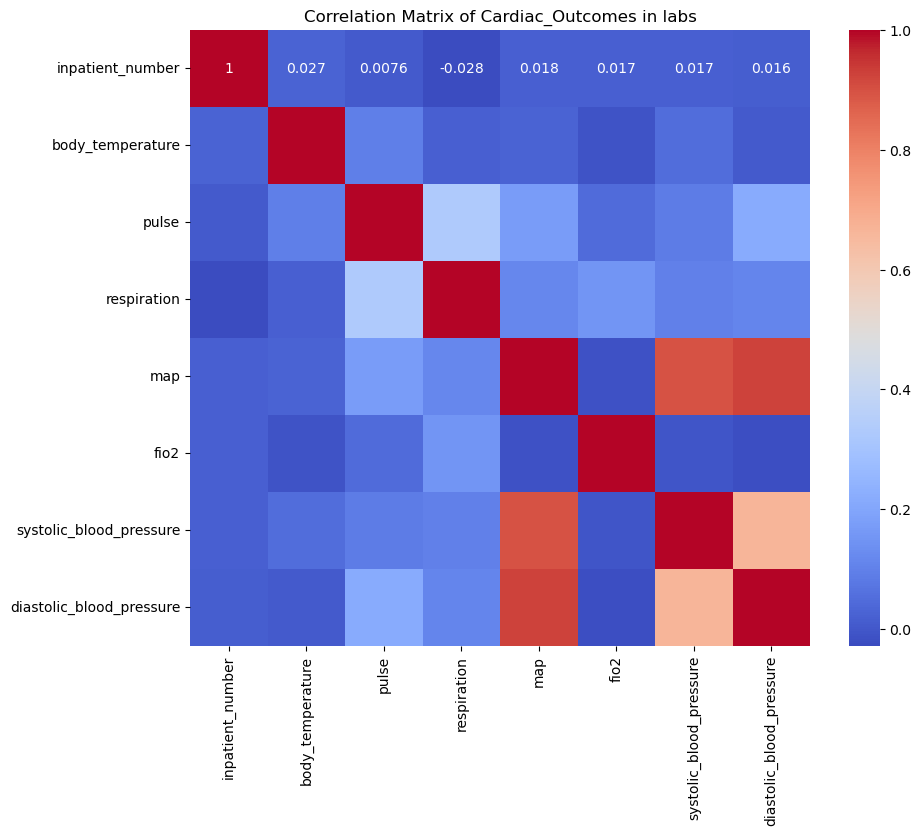

In [27]:
#ques18 Create a heatmap on any columns of your choice including at least 1 lab value
#Heatmap: Correlation Matrix.
plt.figure(figsize=(10, 8))
df1=df_Labs.loc[:,['inpatient_number', 'body_temperature','pulse','respiration','map','fio2','systolic_blood_pressure','diastolic_blood_pressure']]
correlation_matrix = df1.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Cardiac_Outcomes in labs')
plt.show()

## Question19 Create a bar chart by making list on Avg BMI and occupation column (with no duplicates) & make the hatchs onto the bar by 
## using set_hatch() method

In [28]:
#19 Create a bar chart by making list on Avg BMI and occupation column (with no duplicates) & make the hatchs onto the bar by using set_hatch() method
#removing duplicates from BMI.
bmiduplicate=df_Demography['BMI'].drop_duplicates().shape
bmiduplicate

(661,)

In [29]:
#Removing duplicates from occupation 
occuduplicate=df_Demography['occupation'].drop_duplicates().shape
occuduplicate

(6,)

Total BMI Records= 2008
Sum of BMI Values with duplicate value= 43757.126271910434
Average with duplicate value= 21.791397545772128
Total records without duplicates= (661,)
Sum of BMI Values without duplicate value= 15247.643025815602
Average without duplicates= [23.06753862]
occupation without duplicates (6,)


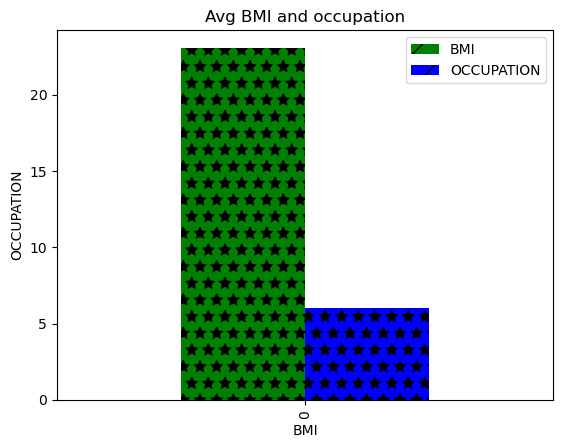

In [30]:
#finding avg bmi
#Total BMI Records
totalbmi=len(df_Demography['BMI'])
print("Total BMI Records=",totalbmi)

#Sum of BMI values with duplicates
sumbmidup=df_Demography['BMI'].sum()
print("Sum of BMI Values with duplicate value=",sumbmidup)

#Average of BMI with Duplicate
Avgwithdup=sumbmidup/totalbmi
print("Average with duplicate value=",Avgwithdup)

#Total Record Count  for bmi without duplicate
bmiduplicate=df_Demography['BMI'].drop_duplicates().shape
print("Total records without duplicates=",bmiduplicate)

#sum of BMI without duplicates
sumbmiwithoutdup=(df_Demography['BMI'].drop_duplicates()).sum()
print("Sum of BMI Values without duplicate value=",sumbmiwithoutdup)

#Average of BMI without Duplicates.
avgwithoutdup=sumbmiwithoutdup/bmiduplicate
print("Average without duplicates=",avgwithoutdup)

print("occupation without duplicates",occuduplicate)
data = {"BMI": avgwithoutdup, "OCCUPATION": occuduplicate}
pd.DataFrame(data).plot.bar(color=("green", "blue"), hatch=("/", "*"))
plt.xlabel('BMI')
plt.ylabel('OCCUPATION')
plt.title('Avg BMI and occupation')
plt.show()

## Question20 You are given three integers x,y,z representing the dimensions of a cuboid along with an integer n . 
## Print a list of all possible coordinates given by(i,j,k) on a 3D grid where the sum of i,j,k is not equal to n. 
## x=1, y=1, z=2, n-3

In [31]:
# question 20 You are given three integers x,y,z representing the dimensions of a cuboid along with an integer n . 
#Print a list of all possible coordinates given by(i,j,k) on a 3D grid where the sum of i,j,k is not equal to n. 
#x=1, y=1, z=2, n-3
x = 1
y = 1
z = 2
n = 3
print(list([i,j,k] for i in range(x+1) for j in range(y+1) for k in range(z+1)  if i+j+k !=n))


[[0, 0, 0], [0, 0, 1], [0, 0, 2], [0, 1, 0], [0, 1, 1], [1, 0, 0], [1, 0, 1], [1, 1, 0], [1, 1, 2]]


## Question21 Given the names and grades for each student in a class of students, store them in a nested list and print the name(s) of
## any student(s) having the second lowest grade.
## python_students = [['Harry', 37.21], ['Berry', 37.21], ['Tina', 37.2], ['Akriti', 41], ['Harsh', 39]]

In [32]:
#21   Given the names and grades for each student in a class of students, store them in a nested list and print the name(s) of any 
#      student(s) having the second lowest grade.
#      Input   :python_students = 5 then give these names and grades[['Harry', 37.21], ['Berry', 37.21], ['Tina', 37.2], ['Akriti', 41], ['Harsh', 39]]
ListofStudentsAndGrades = [['Harry', 37.21], ['Berry', 37.21],['Tina', 37.2], ['Akriti', 41], ['Harsh', 39]]
ListofStudentsAndGrades.sort(key=lambda x: x[1])
#print(ListofStudentsAndGrades)
SecondLowestListofStudents = ListofStudentsAndGrades[1]

SortedListOfStudents =[]
for increment in ListofStudentsAndGrades:
    if increment[1] == SecondLowestListofStudents[1]:
        SortedListOfStudents.append(increment)
      
SortedListOfStudents.sort(key=lambda x: x[0])
print(f"Second Lowest Student(s) and Grade(s) {SortedListOfStudents}")

Second Lowest Student(s) and Grade(s) [['Berry', 37.21], ['Harry', 37.21]]


## Question22 Which patient was on the most number of prescribed drugs? What was his age and outcome?

In [33]:
#displaying all the patients patient number with value counts from largest to smallest count
counta=pd.Series(df_Patient_Prescriptions['inpatient_number']).value_counts()
print(counta)

inpatient_number
777204    16
867885    15
746487    15
766722    15
800659    15
          ..
796480     1
822437     1
829624     1
869886     1
753570     1
Name: count, Length: 2009, dtype: int64


In [34]:
# the first row has largest,to display only frst row
print(counta.iloc[[0]])

inpatient_number
777204    16
Name: count, dtype: int64


In [35]:
# patient was on the most number of prescribed drugs? What was his age and outcome?(final solution)
df_Demography.loc[df_Demography['inpatient_number']==777204]

,inpatient_number,gender,weight,height,BMI,occupation,ageCat
724,777204,Male,45.0,1.55,18.730489,UrbanResident,79-89


## Question23 How many patients were prescribed Digoxin?

In [36]:
x=len(df_Patient_Prescriptions)
drugname=df_Patient_Prescriptions['Drug_name']
digoxin=df_Patient_Prescriptions[drugname == 'Digoxin tablet']
lengthdia=len(digoxin)
print(f'{lengthdia} Patients were prescribed digoxin out of total prescribed count {x}')

999 Patients were prescribed digoxin out of total prescribed count 15370


## Question24 What columns indicate a prescence of anemia? Create a severity score for anemia and prove or disprove a correlation to Length of stay

In [83]:
# Instead of Hemoglobin value, I have taken mean_platelet_volumne(test results are close to anemic).
#Hemoglobin values are too high not fit for calcuation
CBC_TestResults=pd.DataFrame(df_Labs[['inpatient_number','red_blood_cell','hemoglobin']])
Demography_Info=pd.DataFrame(df_Demography[['inpatient_number','gender']])
Hospitalization_Discharge=pd.DataFrame(df_Hospitalization_Discharge[['inpatient_number','dischargeDay']])
#CBC_TestResults = CBC_TestResults.rename(columns={'mean_platelet_volume': 'hemoglobin'})
CBC_TestResults = pd.merge(CBC_TestResults, Demography_Info, on='inpatient_number', how='inner')
CBC_TestResults = pd.merge(CBC_TestResults, Hospitalization_Discharge, on='inpatient_number', how='inner')
CBC_TestResults['Anemia'] = 'False'
CBC_TestResults['Severity'] = 'NAN'
CBC_TestResults['hemoglobin'] = (CBC_TestResults['hemoglobin'] * 0.10)
#print(CBC_TestResults)

s_char = '='
n_times = 75
HeadingPrintCharacter = f"{s_char * n_times}"
HeadingTextPrint1 =  f"{' ' * 25}Patient CBC Test Results"
HeadingTextPrint2 =  f"{' ' * 15}Patient CBC Test Results"
for row in range(len(CBC_TestResults)):
    gender = CBC_TestResults['gender'][row]
    redBloodCellCount = CBC_TestResults['red_blood_cell'][row]
    hemoglobinCount = CBC_TestResults['hemoglobin'][row]
  
    #Severity Indicators -
        #         Age	     Mild	  Moderate	Severe
        #Female >14 years	11–11.9	   8–10.9	<8
        #Male >14 years	    11–12.9	   8–10.9	<8
    
    if gender == 'Male':
        if redBloodCellCount < 5 or hemoglobinCount < 14:
            CBC_TestResults['Anemia'][row] = 'True'
            
            if hemoglobinCount < 8:
                    CBC_TestResults['Severity'][row] = 'Severe'
                    #print(f"Male patient, severe anemic, RowId : {row} ")    
            else:
                if hemoglobinCount < 11:
                    CBC_TestResults['Severity'][row] = 'Moderate'
                    #print(f"Male patient, Moderate anemic, RowId : {row} ")  
                else:
                    if hemoglobinCount < 13:
                        CBC_TestResults['Severity'][row] = 'Mild'
    else:
         if gender == 'Female':
            if redBloodCellCount < 4 or hemoglobinCount < 12:
                CBC_TestResults['Anemia'][row] = 'True'
                if hemoglobinCount < 8:
                    CBC_TestResults['Severity'][row] = 'Severe'
                    #print(f"female patient, severe anemic, RowId : {row} ")    
                else:
                    if hemoglobinCount < 11:
                         CBC_TestResults['Severity'][row] = 'Moderate'
                         #print(f"female patient, Moderate anemic, RowId : {row} ")    
                    else:
                        if hemoglobinCount < 12:
                            CBC_TestResults['Severity'][row] = 'Mild'


Patient_Postive_Anemic = CBC_TestResults.loc[CBC_TestResults['Anemia'] == 'True']
Patient_Postive_Severity_Mild = CBC_TestResults.loc[CBC_TestResults['Severity'] == 'Mild']
Patient_Postive_Severity_Moderate = CBC_TestResults.loc[CBC_TestResults['Severity'] == 'Moderate']
Patient_Postive_Severity_Severe = CBC_TestResults.loc[CBC_TestResults['Severity'] == 'Severe']


print(f"{HeadingTextPrint1} - Positive Anemic") 
Patient_Postive_Anemic
#print(Patient_Postive_Anemic) 




# print(HeadingPrintCharacter)
# print(HeadingPrintCharacter1) 
# print(HeadingPrintCharacter)
# print(CBC_TestResults)            

                         Patient CBC Test Results - Positive Anemic


,inpatient_number,red_blood_cell,hemoglobin,gender,dischargeDay,Anemia,Severity
0,857781,4.09,13.1,Male,11,True,NAN
1,743087,3.93,11.4,Female,8,True,Mild
2,866418,4.43,14.4,Male,5,True,NAN
3,775928,2.71,9.4,Male,11,True,Moderate
5,823318,3.44,10.0,Female,6,True,Moderate
...,...,...,...,...,...,...,...
1999,804209,2.61,8.3,Female,29,True,Moderate
2001,726701,3.45,10.4,Male,10,True,Moderate
2004,734280,4.19,9.9,Female,8,True,Moderate
2006,744870,4.05,13.3,Male,1,True,NAN


In [84]:
print(f"{HeadingTextPrint2} - Severe Anemic") 
Patient_Postive_Severity_Severe


               Patient CBC Test Results - Severe Anemic


,inpatient_number,red_blood_cell,hemoglobin,gender,dischargeDay,Anemia,Severity
11,748109,2.44,6.7,Female,9,True,Severe
15,852562,3.58,7.2,Female,3,True,Severe
20,764082,1.17,3.6,Female,5,True,Severe
26,846186,3.40,7.6,Female,8,True,Severe
31,814480,2.71,7.9,Female,10,True,Severe
...,...,...,...,...,...,...,...
1950,727734,2.75,7.0,Female,10,True,Severe
1969,820600,1.63,5.5,Female,12,True,Severe
1981,848903,1.27,3.5,Female,9,True,Severe
1987,759370,2.54,5.4,Female,28,True,Severe


## Question25 Using GCS score, how many patients are considered to be in a coma?

In [37]:
#To find unique values in GCS Column
df_Responsivenes['GCS'].unique()

array([15, 11, 13, 12,  3, 10,  6,  7, 14,  4], dtype=int64)

In [38]:
#response[response["GCS"]==4].count()["inpatient_number"]
print(f'There are {df_Responsivenes[df_Responsivenes["GCS"]<=4].count()["inpatient_number"]} patients are considered to be in a coma based on GCS value')

There are 14 patients are considered to be in a coma based on GCS value


## Question26  Create a column that randomly generates an age between the age group given for each patient. What was the average age of the patients?

In [63]:
df_Demography['age'] = df_Demography['ageCat'].str.split(pat='-')
#print(demog['age'])
for row in range(len(df_Demography)):
    ageStartRange = df_Demography['age'][row][0]
    ageEndRange = df_Demography['age'][row][1]
    Random_age=np.random.randint(ageStartRange,ageEndRange)
    df_Demography.iloc[row,7] = Random_age
df_Demography


,inpatient_number,gender,weight,height,BMI,occupation,ageCat,category_bmi,age
0,857781.0,Male,50.0,1.64,18.590125,UrbanResident,69-79,72,"[69, 79]"
1,743087.0,Female,51.0,1.63,19.195303,UrbanResident,69-79,72,"[69, 79]"
2,866418.0,Male,70.0,1.70,24.221453,farmer,59-69,60,"[59, 69]"
3,775928.0,Male,65.0,1.70,22.491349,UrbanResident,69-79,70,"[69, 79]"
4,810128.0,Female,76.0,1.55,31.633715,UrbanResident,69-79,73,"[69, 79]"
...,...,...,...,...,...,...,...,...,...
2003,740689.0,Female,35.0,1.50,15.555556,Others,79-89,88,"[79, 89]"
2004,734280.0,Female,50.0,1.55,20.811655,UrbanResident,79-89,80,"[79, 89]"
2005,781004.0,Male,75.0,1.70,25.951557,UrbanResident,39-49,40,"[39, 49]"
2006,744870.0,Male,40.0,1.50,17.777778,UrbanResident,49-59,56,"[49, 59]"


In [40]:
#To Find Average age of Patients
Sumofage=df_Demography['age'].sum()
Averageage=Sumofage/len(df_Demography)
print(f"{Averageage} is the average age of patients")

74.04980079681275 is the average age of patients


## Question27 Using the age column generated in Q.26, calculate year of birth for each patient

In [41]:
#To add new column called "yearofbirth" for demography Table.
currentyear=datetime.now().year
df_Demography['yearofbirth']=currentyear-df_Demography['age']
df_Demography


,inpatient_number,gender,weight,height,BMI,occupation,ageCat,age,yearofbirth
0,857781,Male,50.0,1.64,18.590125,UrbanResident,69-79,78,1946
1,743087,Female,51.0,1.63,19.195303,UrbanResident,69-79,75,1949
2,866418,Male,70.0,1.70,24.221453,farmer,59-69,66,1958
3,775928,Male,65.0,1.70,22.491349,UrbanResident,69-79,77,1947
4,810128,Female,76.0,1.55,31.633715,UrbanResident,69-79,71,1953
...,...,...,...,...,...,...,...,...,...
2003,740689,Female,35.0,1.50,15.555556,Others,79-89,88,1936
2004,734280,Female,50.0,1.55,20.811655,UrbanResident,79-89,80,1944
2005,781004,Male,75.0,1.70,25.951557,UrbanResident,39-49,48,1976
2006,744870,Male,40.0,1.50,17.777778,UrbanResident,49-59,54,1970


## Question28 Store patient number and gender in a dictionary as a pair of values. Show the first 10 values

In [42]:
#Selecting first 10 rows of patientid and gender from Demography and creating as a dataframe

dictdemog=pd.DataFrame(df_Demography[['inpatient_number','gender']].head(10))
#To display dataframe  rows and columns
dictdemog

,inpatient_number,gender
0,857781,Male
1,743087,Female
2,866418,Male
3,775928,Male
4,810128,Female
5,823318,Female
6,844094,Male
7,787530,Female
8,795420,Female
9,829801,Female


In [43]:
#Converting into dictionary  and showing in key value pair for ten rows
demography_dict=dictdemog.to_dict()
demography_dict

{'inpatient_number': {0: 857781,
  1: 743087,
  2: 866418,
  3: 775928,
  4: 810128,
  5: 823318,
  6: 844094,
  7: 787530,
  8: 795420,
  9: 829801},
 'gender': {0: 'Male',
  1: 'Female',
  2: 'Male',
  3: 'Male',
  4: 'Female',
  5: 'Female',
  6: 'Male',
  7: 'Female',
  8: 'Female',
  9: 'Female'}}

## Question29 What percentage of those in a coma also have diabetes?

In [44]:
#29   What percentage of those in a coma also have diabetes?From question 25(14 patients are there in coma
#to display  14 patient number with coma and converting to dataframe
comapatient=pd.DataFrame(df_Responsivenes[df_Responsivenes["GCS"]<=4]["inpatient_number"])
comapatient

,inpatient_number
379,731871
626,781960
854,815140
1028,790433
1058,834443
1111,730841
1184,797195
1207,854580
1252,765343
1295,835988


In [45]:
#to check patient id in comapatient and response Dataframe
#merging dataframe for response and comapatient
#pd.merge used for merging
response_comapatient=pd.merge(df_PatientHistory,comapatient)
response_comapatient.columns

Index(['inpatient_number', 'cerebrovascular_disease', 'dementia',
       'Chronic_obstructive_pulmonary_disease', 'connective_tissue_disease',
       'peptic_ulcer_disease', 'diabetes',
       'moderate_to_severe_chronic_kidney_disease', 'hemiplegia', 'leukemia',
       'malignant_lymphoma', 'solid_tumor', 'liver_disease', 'AIDS',
       'CCI_score', 'type_II_respiratory_failure', 'acute_renal_failure'],
      dtype='object')

In [46]:
#after merging displaying coloumns and rows
response_comapatient

,inpatient_number,cerebrovascular_disease,dementia,Chronic_obstructive_pulmonary_disease,connective_tissue_disease,peptic_ulcer_disease,diabetes,moderate_to_severe_chronic_kidney_disease,hemiplegia,leukemia,malignant_lymphoma,solid_tumor,liver_disease,AIDS,CCI_score,type_II_respiratory_failure,acute_renal_failure
0,731871,0,1,0,0,1.0,0,0.0,0,0,0,0,0.0,0,3.0,NonTypeII,0
1,781960,0,1,0,0,0.0,0,0.0,0,0,0,0,0.0,0,2.0,NonTypeII,0
2,815140,0,0,0,1,0.0,0,0.0,0,0,0,0,0.0,0,2.0,TypeII,0
3,790433,1,0,0,0,0.0,1,1.0,0,0,0,0,1.0,0,5.0,NonTypeII,0
4,834443,1,0,0,0,0.0,0,1.0,0,0,0,0,0.0,0,4.0,NonTypeII,0
5,730841,1,0,0,0,0.0,1,1.0,0,0,0,0,0.0,0,4.0,NonTypeII,0
6,797195,0,0,0,0,0.0,0,0.0,0,0,0,0,0.0,0,1.0,NonTypeII,0
7,854580,0,0,1,0,0.0,0,0.0,0,0,0,0,0.0,0,2.0,NonTypeII,0
8,765343,0,0,0,0,0.0,0,1.0,0,0,0,0,0.0,0,2.0,NonTypeII,0
9,835988,0,0,0,0,0.0,0,1.0,0,0,0,0,0.0,0,2.0,NonTypeII,0


In [47]:
#To find counts of diabetic 
response_comapatient.value_counts('diabetes')

diabetes
0    12
1     2
Name: count, dtype: int64

In [48]:
#finding percentage of coma patient having diabetics also
Average_count_diabetics=(2/12)*100
print("percentage of coma patient with diabetics ",Average_count_diabetics,"%")

percentage of coma patient with diabetics  16.666666666666664 %


## Question30 Identify any columns relating to echocardiography and create a severity score for cardiac function. 
## Compare this outcome and show average severity score for each outcome

In [85]:
# Compare this outcome and show average severity score for each outcome
# the known coloums are:
#Killip_grade
#myocardial_infarction
#congestive_heart_failure
#type_of_heart_failure
#LVEF	
#mitral_valve_EMS
#mitral_valve_AMS
#EA
#tricuspid_valve_return_velocity
#tricuspid_valve_return_pressure
#severity score for cardiac function:
#reported a low score (score 0–3; lowest tertile)
#(score 4–9; middle tertile)
#(score 10–35; highest tertile)

In [89]:
#The coloums relating to echocardiography and  paitents postive for echocardiography
# Pull all required columns from CaridacComplications for echoCardiography
test_CardiacComplications = pd.DataFrame(df_CardiacComplications[['inpatient_number','Killip_grade', 'myocardial_infarction','congestive_heart_failure','type_of_heart_failure','LVEF','mitral_valve_EMS','mitral_valve_AMS','EA','tricuspid_valve_return_velocity','tricuspid_valve_return_pressure']])
# Pull all required columns from demographic sheet
Demography_Info1=pd.DataFrame(df_Demography[['inpatient_number','gender']])

# Merge CardiacComplications Sheet Columns and Demographic Columns into single DataFrame
echocardiography = pd.DataFrame(pd.merge(Demography_Info1,test_CardiacComplications,on='inpatient_number', how='inner'))

# Replace String Indicators to numberic Indicator [Both = 2, Left and Right = 1]
echocardiography.loc[echocardiography['type_of_heart_failure']=='Both','type_of_heart_failure'] = 2
echocardiography.loc[echocardiography['type_of_heart_failure']=='Left','type_of_heart_failure'] = 1
echocardiography.loc[echocardiography['type_of_heart_failure']=='Right','type_of_heart_failure'] = 1
# Replace NaN value with 0 value
echocardiography = echocardiography.replace(np.nan, 0)
#echocardiography

In [90]:
#reported a low score (score 0–3; lowest tertile)
#(score 4–9; middle tertile)
#(score 10–35; highest tertile)
#'.loc[row_indexer, col_indexer] = value'
pd.options.mode.copy_on_write = True
#Create Severity Column with Default value as 0
echocardiography['severity'] = 0.00
#Create Severity Column with Default value as 'NaN'
echocardiography['SeverityLevel'] = 'NaN'

# Below Code block looping All rows to identify the Severity Score and Severity Level
for row in range(len(echocardiography)): 
    # Sum of all column values from col 2 to 11 from current row  
    Add_x=echocardiography.iloc[row,2:12].sum()
    # Set the Sum value to Severity Score column[severity]
    #echocardiography['severity'][row]=Add_x
    echocardiography.loc[row,'severity']=Add_x
     # Below if conditional statement, identify the Mild, Moderate and Severe Severity level 
     # assign the value to Severity Level Column
    if Add_x < 4:
        echocardiography.loc[row,'SeverityLevel']='Mild'
    elif Add_x >=4 and Add_x < 10:
        echocardiography.loc[row,'SeverityLevel']='Moderate'
        
    elif Add_x > 9:
        echocardiography.loc[row,'SeverityLevel']='Severe'
        
    else:
        continue

echocardiography


,inpatient_number,gender,Killip_grade,myocardial_infarction,congestive_heart_failure,type_of_heart_failure,LVEF,mitral_valve_EMS,mitral_valve_AMS,EA,tricuspid_valve_return_velocity,tricuspid_valve_return_pressure,severity,SeverityLevel
0,857781,Male,3,0,0,2,0.0,0.00,0.00,0.00,0.00,0.0,5.00,Moderate
1,743087,Female,1,0,0,2,0.0,1.16,1.52,0.00,3.34,47.0,56.02,Severe
2,866418,Male,2,0,0,2,0.0,0.84,0.12,7.00,2.80,32.0,46.76,Severe
3,775928,Male,2,0,0,2,0.0,0.00,0.00,0.00,0.00,0.0,4.00,Moderate
4,810128,Female,2,0,0,2,0.0,1.20,0.90,1.33,0.00,0.0,7.43,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2003,740689,Female,1,0,1,2,0.0,0.00,0.00,0.00,0.00,0.0,4.00,Moderate
2004,734280,Female,2,0,1,2,0.0,0.00,0.00,0.00,2.78,0.0,7.78,Moderate
2005,781004,Male,1,0,1,2,0.0,0.00,0.00,0.00,0.00,0.0,4.00,Moderate
2006,744870,Male,4,0,1,2,0.0,0.00,0.00,0.00,0.00,0.0,7.00,Moderate


In [91]:
#Filter specific Severity Level[Mild, Moderate, Severe] into 3 different Table
MergeTable_Mild_Severity = echocardiography.loc[echocardiography['SeverityLevel'] == 'Mild']
MergeTable_Moderate_Severity = echocardiography.loc[echocardiography['SeverityLevel'] == 'Moderate']
MergeTable_Severe_Severity = echocardiography.loc[echocardiography['SeverityLevel'] == 'Severe']

#Identify the Average value for each severity Level
mild_Average = round(MergeTable_Mild_Severity.loc[:, 'severity'].mean(),2)
moderate_Average = round(MergeTable_Moderate_Severity.loc[:, 'severity'].mean(),2)
Severe_Average =round(MergeTable_Severe_Severity.loc[:, 'severity'].mean(),2)

#Print Average Severity level scores

print(f"Average of Mild Severity     : {mild_Average}" )
print(f"Average of Moderate Severity : {moderate_Average}") 
print(f"Average of Severe Severity   : {Severe_Average}")

Average of Mild Severity     : 3.06
Average of Moderate Severity : 5.81
Average of Severe Severity   : 55.98


## Question31 Group the days to re-admission into bins and count how many patients were in each bin

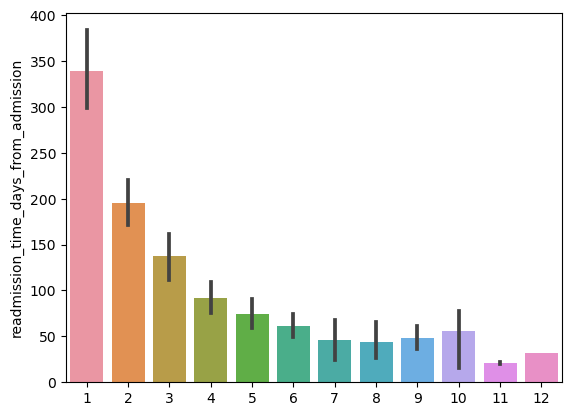

In [49]:
graph = df_Hospitalization_Discharge.groupby(['readmission_time_days_from_admission'])['inpatient_number'].nunique().sort_values(ascending=False)
sns.barplot(y = graph.index, x = graph.values)
plt.show()

## Question32Combine admission_ward & admission_way and count the patients under the new group. Create a pie chart and explode the biggest wedge

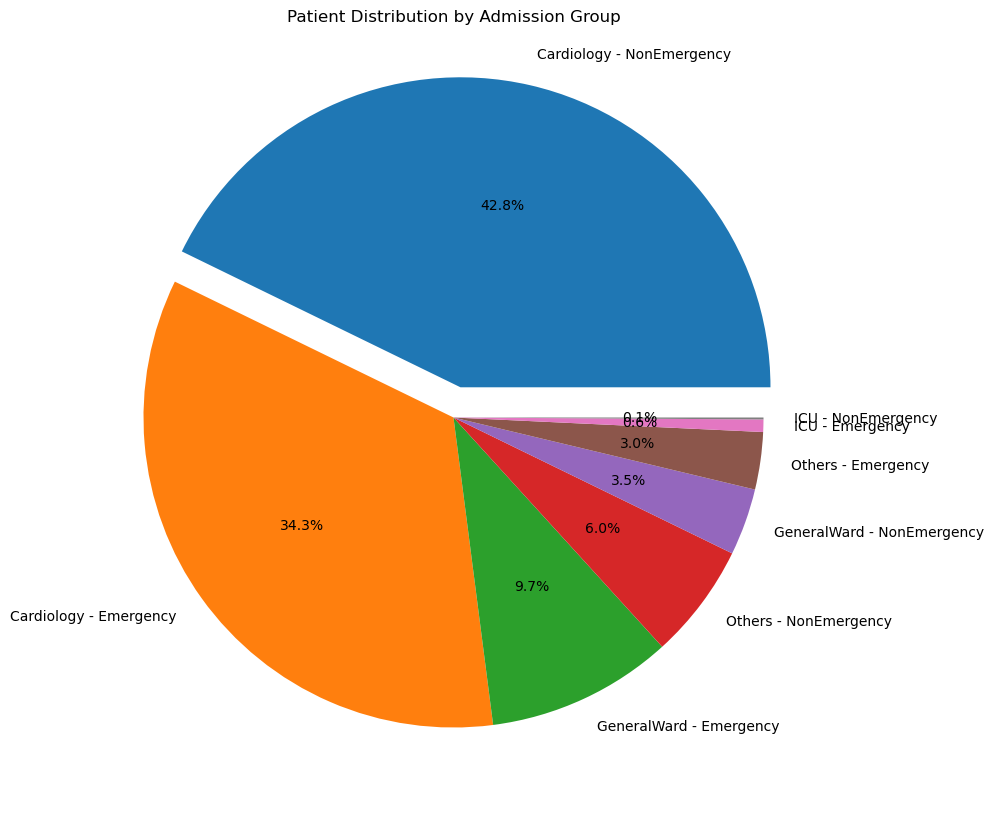

In [50]:
#question32 Combine admission_ward & admission_way and count the patients under the new group. Create a pie chart and explode the biggest wedge
df_hosdis = pd.DataFrame(df_Hospitalization_Discharge)

# Combine admission_ward and admission_way into a new column
df_hosdis['admission_group'] = df_hosdis['admission_ward'] + ' - ' + df_hosdis['admission_way']

# Count patients in each admission group
group_counts = df_hosdis['admission_group'].value_counts()

# Create a pie chart
plt.figure(figsize=(10, 14))
plt.pie(group_counts, labels=group_counts.index, autopct='%1.1f%%',explode=(0.1, 0, 0, 0,0,0,0,0))  # Explode the biggest wedge
plt.title('Patient Distribution by Admission Group')
plt.show()


## Question33 Retrieve the row with minimum white_blood_cell count using sorting technique.

In [51]:
pd.set_option('display.max_columns', None)

result = df_Labs.sort_values("white_blood_cell")

print(result.head(1))

     inpatient_number  body_temperature  pulse  respiration  \
865            746068              37.1     71           20   

     systolic_blood_pressure  diastolic_blood_pressure    map  fio2  \
865                      130                        88  102.0    21   

     creatinine_enzymatic_method  urea  uric_acid  glomerular_filtration_rate  \
865                         88.8  7.26      379.0                       50.86   

     cystatin  white_blood_cell  monocyte_ratio  monocyte_count  \
865      1.51              1.66           0.048            0.08   

     red_blood_cell  \
865             2.4   

     coefficient_of_variation_of_red_blood_cell_distribution_width  \
865                                               17.0               

     standard_deviation_of_red_blood_cell_distribution_width  \
865                                               71.3         

     mean_corpuscular_volume  hematocrit  lymphocyte_count  \
865                    119.2       0.286             

## Question34 get the last letter of discharge_department of patients using RegEX

In [52]:
df = pd.DataFrame()

#regular expression pattern to retrieve the last letter

last_letter = r'.*(\w)$'

df['inpatient_number'] = df_Hospitalization_Discharge['inpatient_number']

df['dept_last_letter'] = df_Hospitalization_Discharge['discharge_department'].astype(str).str.extract(last_letter)

print(df.to_string())

      inpatient_number dept_last_letter
0               857781                y
1               743087                y
2               866418                y
3               775928                y
4               810128                y
5               823318                y
6               844094                y
7               787530                y
8               795420                y
9               829801                y
10              807741                y
11              748109                y
12              802296                y
13              744167                y
14              780534                y
15              852562                y
16              759947                y
17              825016                y
18              820101                y
19              729522                s
20              764082                y
21              765801                y
22              868777                d
23              821261                y


## Question35 find the way to reverse string for given input (eg: input : This hackathon is about cardiac outcomes: outcomes cardiac about is hackathon This)

In [53]:
user_input = input("Enter string for reversal:")
print('Entered String is: \n' + user_input)
s = user_input.split()[::-1]
reversed_input = []
print('Reversed string is:')
for i in s:
    reversed_input.append(i)
print(" ".join(reversed_input))

Enter string for reversal: keghjk


Entered String is: 
keghjk
Reversed string is:
keghjk


## Question36 Use the QB style library to create any multidimensional arrays.Create a figure object called fig using plt.figure() **
## ** Use add_axes to add an axis to the figure canvas at [0,0,1,1]. Call this new axis ax. **
## ** Plot (x,y) on that axes and set the labels.

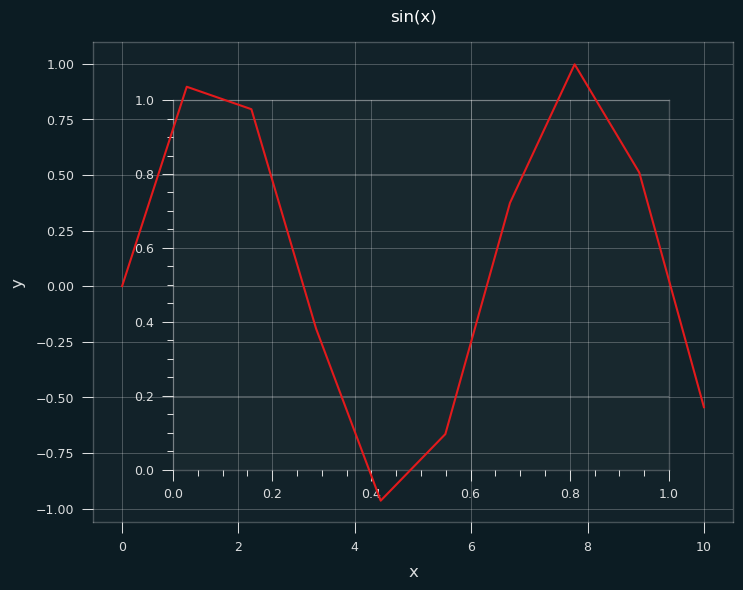

In [54]:
def plot(dark):
    mpl_style(dark)
    x = np.linspace(0, 10, 10)
    y = np.sin(x)
    fig = plt.figure()
    ax= fig.add_axes([0,0,1,1])
    ax.plot(x,y)
    ax.set_title('sin(x)')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.show()
    
plot(dark=True)

## Question37 Using dischargeDay values print even if it even number and odd if it odd number

In [55]:
for i,row in df_Hospitalization_Discharge.iterrows():
    patient_num = row['inpatient_number']
    discharge_day = row['dischargeDay']
    if discharge_day % 2 == 0:
        print(f"Patient: {patient_num}- Discharge day {discharge_day} is even.")
    else:
        print(f"Patient: {patient_num}- Discharge day {discharge_day} is odd.")

Patient: 857781- Discharge day 11 is odd.
Patient: 743087- Discharge day 8 is even.
Patient: 866418- Discharge day 5 is odd.
Patient: 775928- Discharge day 11 is odd.
Patient: 810128- Discharge day 5 is odd.
Patient: 823318- Discharge day 6 is even.
Patient: 844094- Discharge day 10 is even.
Patient: 787530- Discharge day 27 is odd.
Patient: 795420- Discharge day 20 is even.
Patient: 829801- Discharge day 4 is even.
Patient: 807741- Discharge day 9 is odd.
Patient: 748109- Discharge day 9 is odd.
Patient: 802296- Discharge day 11 is odd.
Patient: 744167- Discharge day 22 is even.
Patient: 780534- Discharge day 8 is even.
Patient: 852562- Discharge day 3 is odd.
Patient: 759947- Discharge day 16 is even.
Patient: 825016- Discharge day 14 is even.
Patient: 820101- Discharge day 7 is odd.
Patient: 729522- Discharge day 10 is even.
Patient: 764082- Discharge day 5 is odd.
Patient: 765801- Discharge day 11 is odd.
Patient: 868777- Discharge day 7 is odd.
Patient: 821261- Discharge day 9 is 

## Question38 find the length of Tuple for any given input (Hint: Input a string from user )

In [56]:
user_input = input("Enter string :")
user_tuple = tuple(user_input)
print("Output tuple:", user_tuple)
print("Length of entered tuple:", len(user_tuple))

Enter string : bvjch


Output tuple: ('b', 'v', 'j', 'c', 'h')
Length of entered tuple: 5


## Question39 Create a subplot on x = np.arange(0, 10, 0.1) , y = np.sin(np.pi * x) + x with 2 rows & 2 columns with object oriented approach

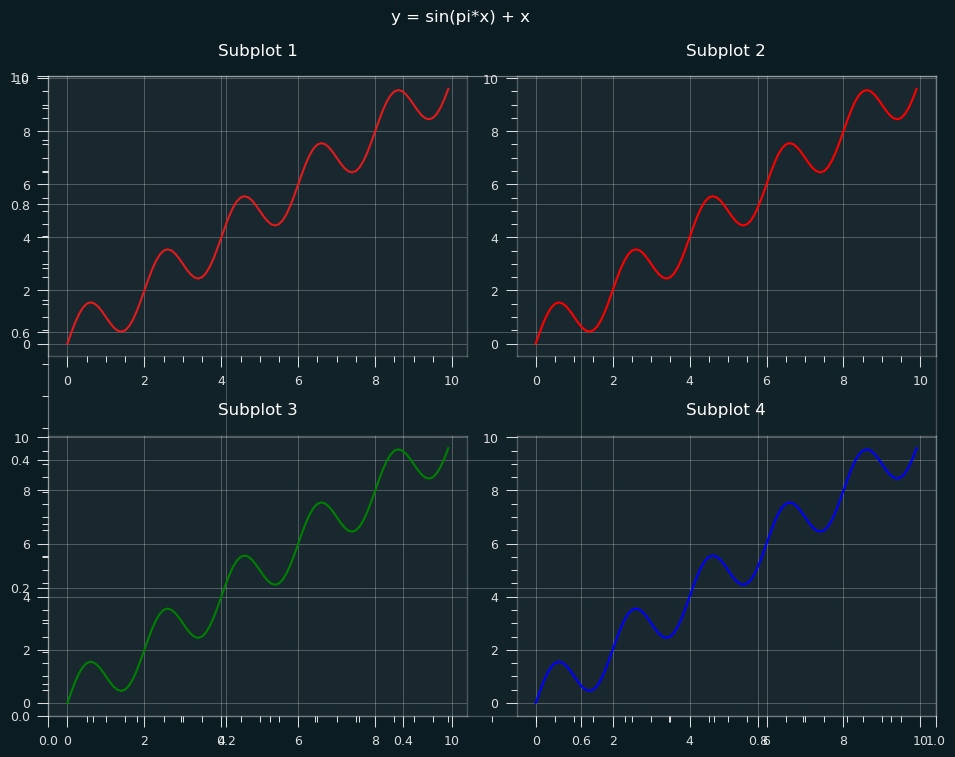

In [57]:
x = np.arange(0, 10, 0.1)
y = np.sin(np.pi * x) + x
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

axs[0, 0].plot(x, y)
axs[0, 0].set_title('Subplot 1')

axs[0, 1].plot(x, y, 'r')
axs[0, 1].set_title('Subplot 2')

axs[1, 0].plot(x, y, 'g')
axs[1, 0].set_title('Subplot 3')

axs[1, 1].plot(x, y, 'b')
axs[1, 1].set_title('Subplot 4')

fig.suptitle('y = sin(pi*x) + x')
plt.tight_layout()
plt.show()

## Question40 Select 25 different random values between 200 to 800.

In [58]:
random.sample(range(200, 800), 25)

[767,
 744,
 628,
 470,
 489,
 393,
 673,
 649,
 517,
 303,
 505,
 397,
 740,
 429,
 690,
 254,
 665,
 674,
 315,
 237,
 209,
 260,
 503,
 657,
 404]

## Question41 Plot the time series of Admission dates with count of patients. The X-Axis should be for every 5 months

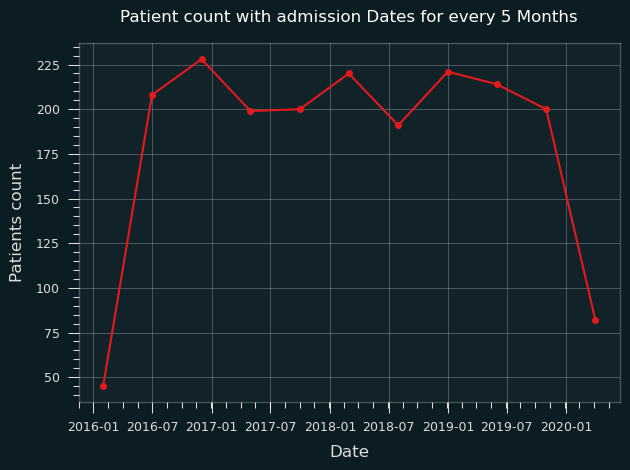

In [59]:
df = pd.DataFrame()

df_Hospitalization_Discharge['Admission_date'] = pd.to_datetime(df_Hospitalization_Discharge['Admission_date'])

patients_per_month = df_Hospitalization_Discharge.groupby(pd.Grouper(key='Admission_date', freq='M')).size()

patients_per_5months = patients_per_month.resample('5M').sum()

plt.plot(patients_per_5months.index, patients_per_5months.values, marker='o', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Patients count')
plt.title('Patient count with admission Dates for every 5 Months')
plt.grid(True)
plt.tight_layout()
plt.show()

## Question42 np.arange(1,21).reshape(4,5), find array slicing to get the elements 1,2,8,19. 
## When the value is less than 9, print as 0,else print 1

In [60]:
array = np.arange(1,21).reshape(4,5)

array_slice = array[0, 0], array[0, 1], array[1, 2], array[3, 3]

print(array_slice)

for i in array_slice:
    if i < 9:
        print(f"{i} :0")
    else:
        print(f"{i} :1")

(1, 2, 8, 19)
1 :0
2 :0
8 :0
19 :1


## Question43 Give Distribution chart of max Killip_grade

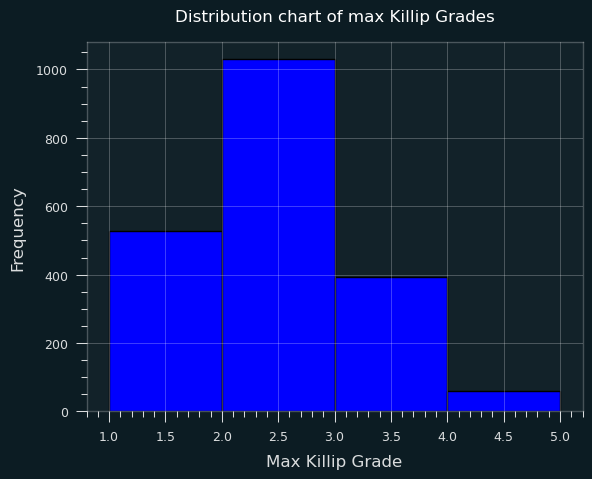

In [61]:
killip_grade_column = 'Killip_grade' 
killip_grades = df_CardiacComplications[killip_grade_column]

max_killip_grade = killip_grades.max()

plt.hist(killip_grades, bins=range(1, max_killip_grade + 2), edgecolor='black', color='blue') 
plt.xlabel('Max Killip Grade')
plt.ylabel('Frequency')
plt.title('Distribution chart of max Killip Grades')
plt.grid(True)

plt.show()

## Question44 Based on Q26 and 27 display all demographic details of patients who are born in year 1945

In [62]:
df_patients_1945 = df_Demography[df_Demography['yearofbirth'] == 1945]
print("Patients born in 1945:")
df_patients_1945

Patients born in 1945:


,inpatient_number,gender,weight,height,BMI,occupation,ageCat,age,yearofbirth
8,795420,Female,60.0,1.55,24.973985,UrbanResident,79-89,79,1945
17,825016,Female,35.0,1.42,17.357667,UrbanResident,79-89,79,1945
22,868777,Female,35.0,1.40,17.857143,UrbanResident,79-89,79,1945
79,746924,Male,65.0,1.72,21.971336,UrbanResident,79-89,79,1945
117,834556,Female,44.0,1.52,19.044321,UrbanResident,79-89,79,1945
127,799827,Male,73.0,1.70,25.259516,UrbanResident,79-89,79,1945
153,858901,Female,40.0,1.48,18.261505,UrbanResident,79-89,79,1945
180,844447,Female,40.0,1.68,14.172336,Others,79-89,79,1945
207,789269,Female,56.0,1.52,24.238227,UrbanResident,79-89,79,1945
255,800350,Male,50.0,1.60,19.531250,UrbanResident,79-89,79,1945


## Question45 Create a dataframe with date and time as columns, where the values are the admission time

In [63]:
df_admission = pd.DataFrame([])
len_of_df = len(df_Hospitalization_Discharge ['Admission_date'])
df_admission['admission_date'] = df_Hospitalization_Discharge ['Admission_date']

df_admission['admission_time'] = '00:00:00'

#df['admission_time'] = pd.to_timedelta(np.random.randint(0, 24*60*60, len_of_df), unit='s')

#df_admission['admission_time'] = df['admission_time'].dt.components['hours'].astype(str) + ':' + \
#                          df['admission_time'].dt.components['minutes'].astype(str) + ':' + \
#                          df['admission_time'].dt.components['seconds'].astype(str)

df_admission

,admission_date,admission_time
0,2017-01-24,00:00:00
1,2017-05-05,00:00:00
2,2016-11-18,00:00:00
3,2017-10-02,00:00:00
4,2019-11-17,00:00:00
...,...,...
2003,2016-02-07,00:00:00
2004,2017-03-29,00:00:00
2005,2018-01-22,00:00:00
2006,2019-11-27,00:00:00


## Question46 Convert occupation into numeric by Label encoding

In [64]:
df = pd.DataFrame()

label_encoder = preprocessing.LabelEncoder()

df['occupation_name'] = df_Demography['occupation']

df['inpatient_number'] = df_Demography['inpatient_number']

df['occupation'] = df_Demography['occupation'] = label_encoder.fit_transform(df_Demography['occupation']) 

df_Demography['occupation'].unique

print(df.to_string())

     occupation_name  inpatient_number  occupation
0      UrbanResident            857781           2
1      UrbanResident            743087           2
2             farmer            866418           3
3      UrbanResident            775928           2
4      UrbanResident            810128           2
5      UrbanResident            823318           2
6      UrbanResident            844094           2
7      UrbanResident            787530           2
8      UrbanResident            795420           2
9      UrbanResident            829801           2
10            worker            807741           4
11     UrbanResident            748109           2
12     UrbanResident            802296           2
13            farmer            744167           3
14     UrbanResident            780534           2
15     UrbanResident            852562           2
16     UrbanResident            759947           2
17     UrbanResident            825016           2
18     UrbanResident           

## Question47 Generate a 3x3 Array using Random values between 1to 9 and Fix the values and position in Next Run.

In [65]:
np.random.seed(1)  

values = np.arange(1, 10)

np.random.shuffle(values)

random_array = values.reshape((3, 3))

print(random_array)

[[9 3 7]
 [8 2 1]
 [5 4 6]]


## Question48 Using loops, create a multiplication table for the number 7

In [66]:
multiplier = 7
row = int(input("Enter number of rows for 7 multiplication table:"))

for i in range(1, row+1):
    product = multiplier * i
    print(f"{multiplier} * {i} = {product}") 

Enter number of rows for 7 multiplication table: 5


7 * 1 = 7
7 * 2 = 14
7 * 3 = 21
7 * 4 = 28
7 * 5 = 35


## Question49 Connect to sql and write a query to find all patients who have a gender of 'Male' ( Attach screenshots for this question)

In [67]:
from pandasql import sqldf
sqlquery = "SELECT * FROM df_Demography WHERE gender = 'Male'"
result = sqldf(sqlquery)
print(result)

     inpatient_number gender  weight  height        BMI  occupation ageCat  \
0              857781   Male    50.0    1.64  18.590125           2  69-79   
1              866418   Male    70.0    1.70  24.221453           3  59-69   
2              775928   Male    65.0    1.70  22.491349           2  69-79   
3              844094   Male    60.0    1.65  22.038567           2  79-89   
4              802296   Male    70.0    1.72  23.661439           2  79-89   
..                ...    ...     ...     ...        ...         ...    ...   
840            816947   Male    46.5    1.50  20.666667           2  69-79   
841            750447   Male    60.0    1.68  21.258503           2  79-89   
842            726701   Male    60.0    1.60  23.437500           2  79-89   
843            781004   Male    75.0    1.70  25.951557           2  39-49   
844            744870   Male    40.0    1.50  17.777778           2  49-59   

     age  yearofbirth  
0     78         1946  
1     66       

## Q 50 Display the lab details of the patient with maximum pulse using the .loc

In [68]:
index = df_Labs['pulse'].idxmax()
patient_max_pulse = df_Labs.loc[index]
print("Lab reports of patient with max pulse:\n",patient_max_pulse) 

Lab reports of patient with max pulse:
 inpatient_number           756996.00
body_temperature               36.00
pulse                         198.00
respiration                    19.00
systolic_blood_pressure       105.00
                             ...    
partial_oxygen_pressure       125.00
oxyhemoglobin                  97.60
anion_gap                      12.50
free_calcium                    1.07
total_hemoglobin              132.00
Name: 457, Length: 107, dtype: float64


## Q 51 Display a violin chart to show distribution of Pulse Rate against age.

(array([-50.,   0.,  50., 100., 150., 200., 250.]),
 [Text(0, -50.0, '−50'),
  Text(0, 0.0, '0'),
  Text(0, 50.0, '50'),
  Text(0, 100.0, '100'),
  Text(0, 150.0, '150'),
  Text(0, 200.0, '200'),
  Text(0, 250.0, '250')])

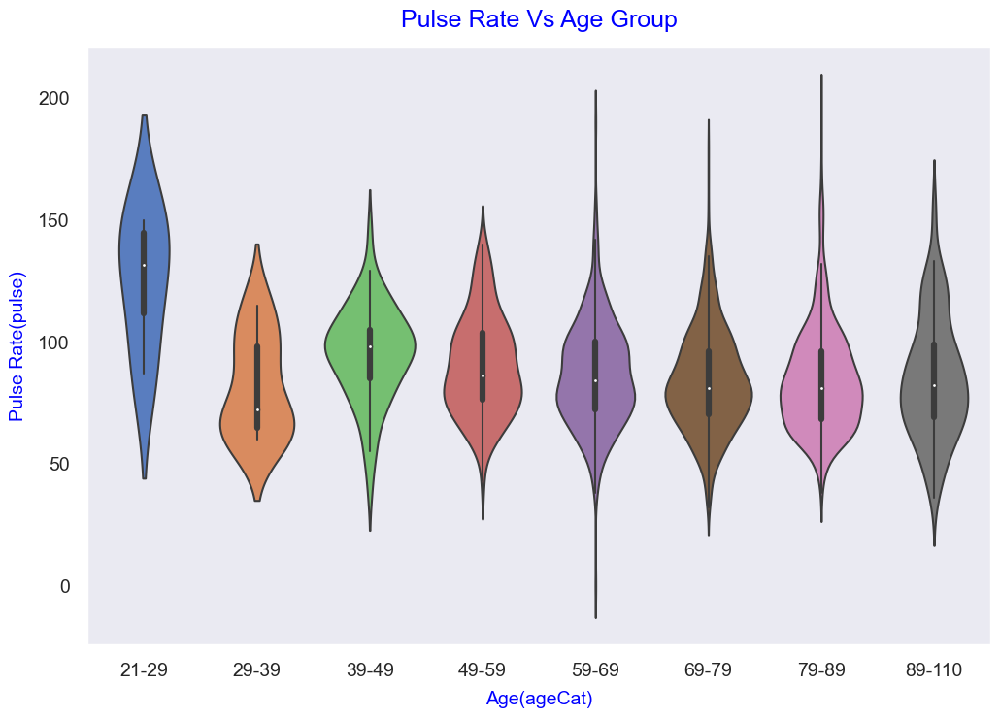

In [69]:
sns.set_style("dark" ,{"grid.color": ".6", "grid.linestyle": ":"}) 
plt.figure(figsize=(12, 8))
sns.violinplot(x=df_Demography.sort_values(by='ageCat')['ageCat'], y=df_Labs['pulse'], palette="muted")
plt.title('Pulse Rate Vs Age Group', fontsize=18, color ='blue')
plt.xlabel('Age(ageCat)', fontsize=14, color='blue')
plt.ylabel('Pulse Rate(pulse)', fontsize=14, color='blue')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

## Q 52 Create a Point Plot on Age against time to readmission.

(array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450.]),
 [Text(0, 0.0, '0'),
  Text(0, 50.0, '50'),
  Text(0, 100.0, '100'),
  Text(0, 150.0, '150'),
  Text(0, 200.0, '200'),
  Text(0, 250.0, '250'),
  Text(0, 300.0, '300'),
  Text(0, 350.0, '350'),
  Text(0, 400.0, '400'),
  Text(0, 450.0, '450')])

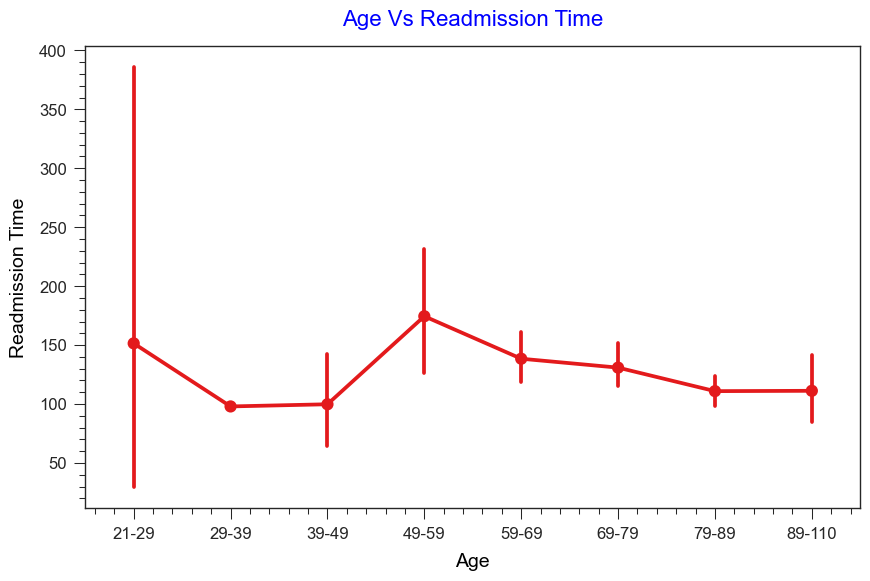

In [70]:
sns.set_style("ticks")
plt.figure(figsize=(10, 6))
combined_df = pd.merge(df_Demography, df_Hospitalization_Discharge, on='inpatient_number')
combined_df_sorted = combined_df.sort_values(by='ageCat')
sns.pointplot(x='ageCat', y= "readmission_time_days_from_admission", data=combined_df_sorted)
plt.title('Age Vs Readmission Time', fontsize=16, color='blue')
plt.xlabel('Age', fontsize=14, color='black')
plt.ylabel('Readmission Time', fontsize=14, color='black')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

## Q 53 What is the correlation between CCI score and outcome?

In [71]:
df_Hospitalization_Discharge['outcome_during_hospitalization'].unique()
outcome_mapping = {'Alive': 1, 'Dead': 2, 'DischargeAgainstOrder': 3}
df_Hospitalization_Discharge['outcome'] = df_Hospitalization_Discharge['outcome_during_hospitalization'].map(outcome_mapping)
cf = df_PatientHistory['CCI_score'].corr(df_Hospitalization_Discharge['outcome'])
print("The correlation between CCI score and outcome: ", round(cf,3))

The correlation between CCI score and outcome:  0.094


## Q 54 For all non-negative integers that are also even numbers in the array [0,1,2,6,8] print i*i


In [72]:
given_array =[0,1,2,6,8]
for i in given_array:
    if i>0 and i%2==0:
        print(i*i)
   

4
36
64


## Q 55 Create a jointplot on diastolic_blood_pressure & length of stay

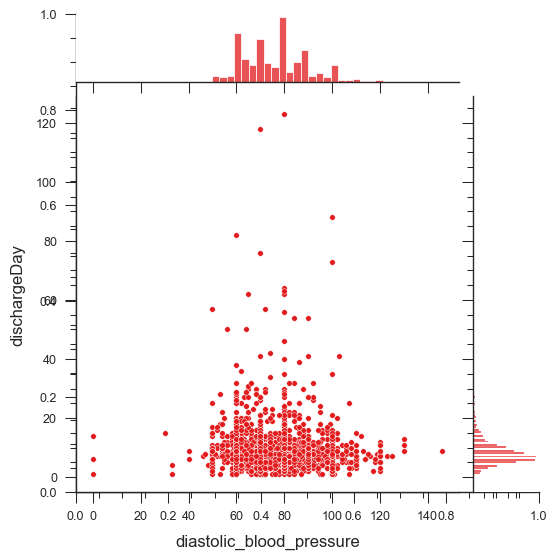

In [73]:
df_hospitaldischarge=pd.read_excel('Cardiac_Outcomes.xlsx', sheet_name='Hospitalization_Discharge')
df_Labs=pd.read_excel('Cardiac_Outcomes.xlsx', sheet_name='Labs')

df_combined= pd.merge(df_hospitaldischarge,df_Labs,on='inpatient_number',how='left')

sns.jointplot(x = "diastolic_blood_pressure", y = "dischargeDay", kind = "scatter", data = df_combined) 


## Q 56 Using loc, retrieve the agegroup and weight between indices 101 and 201.

In [74]:
display(df_Demography.iloc[101:201 , [2,6]])

,weight,ageCat
101,41.0,69-79
102,64.0,79-89
103,61.0,79-89
104,40.0,79-89
105,73.0,69-79
...,...,...
196,62.0,59-69
197,50.0,79-89
198,50.0,89-110
199,50.0,69-79


## Q 57 Create a pivot table show shows outcome type as rows, the admission_ward as columns and counts of patients in each category as values

In [75]:
pivot = df_hospitaldischarge.pivot_table(index=['outcome_during_hospitalization'], columns=['admission_ward'],values=['inpatient_number'], aggfunc='count')
pivot

inpatient_number                       
admission_ward                       Cardiology GeneralWard ICU Others
outcome_during_hospitalization                                        
Alive                                      1472         238  12    168
Dead                                          8           1   1      1
DischargeAgainstOrder                        67          26   2     12

## Q 58 Use Hexagonal binning to show the density of patients who were readmitted when compared to Discharge Days

(array([-500.,    0.,  500., 1000., 1500., 2000., 2500.]),
 [Text(0, -500.0, '−500'),
  Text(0, 0.0, '0'),
  Text(0, 500.0, '500'),
  Text(0, 1000.0, '1000'),
  Text(0, 1500.0, '1500'),
  Text(0, 2000.0, '2000'),
  Text(0, 2500.0, '2500')])

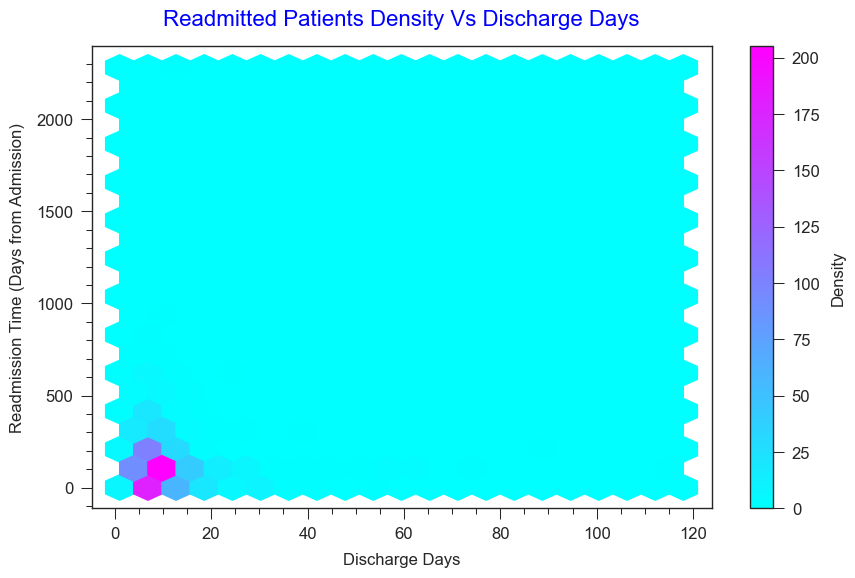

In [76]:
plt.figure(figsize=(10, 6))
plt.hexbin(df_hospitaldischarge['dischargeDay'], df_hospitaldischarge['readmission_time_days_from_admission'], gridsize=20, cmap='cool')
cbar = plt.colorbar(label='Density')
cbar.ax.yaxis.label.set_fontsize(12)
cbar.ax.tick_params(labelsize=12)
plt.title('Readmitted Patients Density Vs Discharge Days', fontsize=16, color='blue')
plt.xlabel('Discharge Days', fontsize=12)
plt.ylabel('Readmission Time (Days from Admission)', fontsize=12) 
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


## Q 59 Using Sunburst chart display patients Age group, occupation and BMI Group

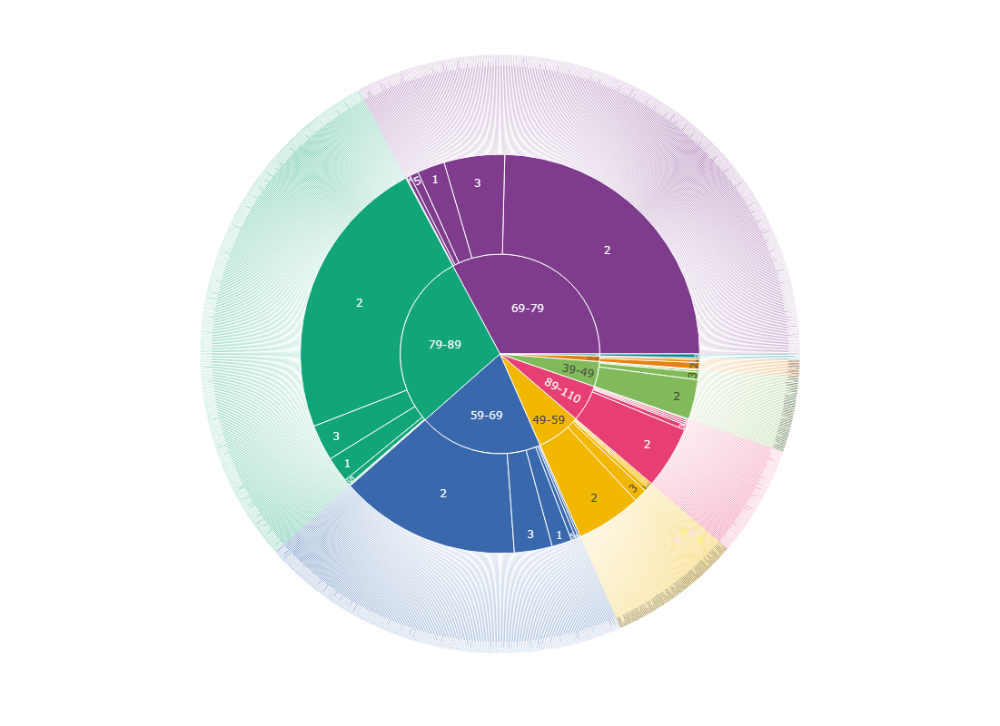

In [77]:
import plotly.express as px
import pandas as pd
df_demo = df_Demography.groupby(['ageCat', 'occupation', 'BMI']).size().reset_index(name='count')
px.sunburst(df_demo, path=['ageCat', 'occupation', 'BMI'],maxdepth=3, width=1000,height=800,
            color_discrete_sequence=px.colors.qualitative.Bold)

## Q 60 Plot the Density Chart for visit times

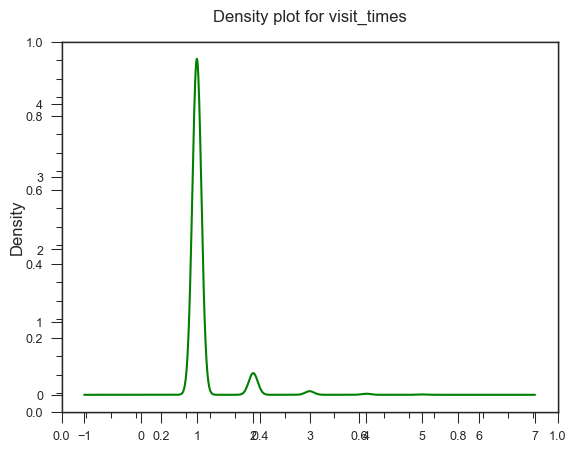

In [78]:
df_hospitaldischarge.visit_times.plot.density(color='green') 
plt.title('Density plot for visit_times') 
plt.show()

## Q 61 np.arange(1,31).reshape(6,5) Find the array slicing to get the elements with values 11,12,16,17.

In [79]:
arr = np.arange(1, 31).reshape(6, 5) 
desired_values = {11, 12, 16, 17} 
row_indices,col_indices = np.where(np.isin(arr, list(desired_values))) 
row_start,row_end = min(row_indices), max(row_indices) + 1  
col_start,col_end = min(col_indices), max(col_indices) + 1
slicing_indices = f"{row_start}:{row_end}, {col_start}:{col_end}" 
print("indices Slicing to extract element value:", slicing_indices)
print (arr[row_start:row_end, col_start:col_end]) 


indices Slicing to extract element value: 2:4, 0:2
[[11 12]
 [16 17]]


## Q 62 What % of all patients with an outcome of "Alive" died within 28 days. What was the mean platelet volume among this group?

In [80]:
died_within_28_days = df_hospitaldischarge[(df_hospitaldischarge['outcome_during_hospitalization'] == 'Alive') & 
                                                      (df_hospitaldischarge['death_within_28_days'] == 1)]
patients_died_within_28_days = (len(died_within_28_days) / len(df_hospitaldischarge[df_hospitaldischarge['outcome_during_hospitalization'] == 'Alive'])) * 100
print(f"Percentage of patients with an outcome of 'Alive' who died within 28 days: {patients_died_within_28_days:.2f}%")
combined_data = pd.merge(died_within_28_days, df_Labs[['inpatient_number', 'mean_platelet_volume']], on='inpatient_number')
mean_platelet_volume = combined_data['mean_platelet_volume'].mean()
print(f"Mean platelet volume among patients who had an outcome of 'Alive' and died within 28 days: {mean_platelet_volume:.2f}")


Percentage of patients with an outcome of 'Alive' who died within 28 days: 0.42%
Mean platelet volume among patients who had an outcome of 'Alive' and died within 28 days: 12.60


## Q 63 find the patients who have 'h' in their DestinationDischarge and print them

In [81]:
df_hospitaldischarge[df_hospitaldischarge['DestinationDischarge'].str.contains('h')]

,inpatient_number,DestinationDischarge,admission_ward,admission_way,discharge_department,visit_times,respiratory_support,oxygen_inhalation,dischargeDay,Admission_date,outcome_during_hospitalization,death_within_28_days,re_admission_within_28_days,death_within_3_months,re_admission_within_3_months,death_within_6_months,re_admission_within_6_months,time_of_death__days_from_admission,readmission_time_days_from_admission,return_to_emergency_department_within_6_months,time_to_emergency_department_within_6_months
7,787530,HealthcareFacility,Cardiology,Emergency,Cardiology,1,NaN,OxygenTherapy,27,2017-09-11,Alive,0,0,0,1,0,1,NaN,58.0,1.0,58.0
18,820101,HealthcareFacility,Cardiology,NonEmergency,Cardiology,1,NaN,OxygenTherapy,7,2016-09-22,Alive,0,0,0,0,0,0,NaN,NaN,0.0,NaN
22,868777,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1,NaN,OxygenTherapy,7,2016-11-14,Alive,0,0,0,0,0,1,NaN,91.0,1.0,91.0
29,861240,HealthcareFacility,Cardiology,Emergency,Cardiology,1,NaN,OxygenTherapy,7,2016-01-03,Alive,0,1,0,1,0,1,NaN,20.0,1.0,20.0
31,814480,HealthcareFacility,Cardiology,Emergency,Cardiology,1,NaN,OxygenTherapy,10,2016-02-05,Alive,0,0,0,0,0,0,NaN,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2001,726701,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1,NaN,OxygenTherapy,10,2016-07-09,Alive,0,0,0,1,0,1,NaN,46.0,1.0,46.0
2002,754589,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1,NaN,OxygenTherapy,8,2017-06-12,Alive,0,0,0,0,0,0,NaN,NaN,0.0,NaN
2003,740689,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1,NaN,OxygenTherapy,5,2016-02-07,DischargeAgainstOrder,0,0,0,0,0,0,NaN,NaN,0.0,NaN
2004,734280,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1,NaN,OxygenTherapy,8,2017-03-29,Alive,0,0,0,0,0,0,NaN,NaN,0.0,NaN


## Q 64 Create a grouped bar chart that shows number of patients by gender and ageCat

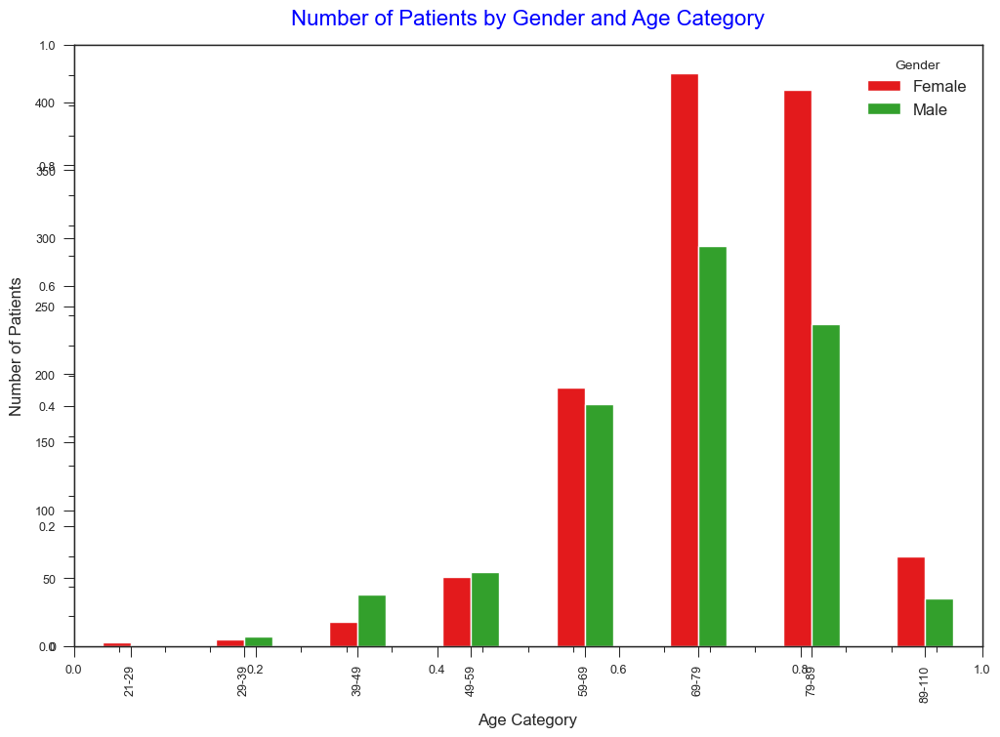

In [82]:
grouped_df = df_Demography.groupby(['ageCat','gender']).size().unstack()
grouped_df.plot(kind='bar', figsize=(12,8))
plt.title('Number of Patients by Gender and Age Category', fontsize=16, color='blue')
plt.xlabel('Age Category', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.legend(title='Gender',fontsize=12)

# Question no.65 Which Admission Ward has maximum number of visits scheduled


In [12]:
df1=df_Hospitalization_Discharge.groupby('admission_ward')['visit_times'].sum()
df2=df1.sort_values(ascending=False).head(1)
df2

admission_ward
Cardiology    1703.0
Name: visit_times, dtype: float64

# Question no.66 Display total count of patients in each discharge_department based on gender

In [14]:
df1=df_Hospitalization_Discharge[['discharge_department','inpatient_number']]
df2=df_Demography[['gender','inpatient_number']]

In [15]:
merge_1=df1.merge(df2,left_on='inpatient_number', right_on='inpatient_number')
merge_1

,discharge_department,inpatient_number,gender
0,Cardiology,857781.0,Male
1,Cardiology,743087.0,Female
2,Cardiology,866418.0,Male
3,Cardiology,775928.0,Male
4,Cardiology,810128.0,Female
...,...,...,...
2003,GeneralWard,740689.0,Female
2004,GeneralWard,734280.0,Female
2005,Cardiology,781004.0,Male
2006,Cardiology,744870.0,Male


In [16]:
merge_1.groupby(['discharge_department','gender'])['inpatient_number'].sum()

discharge_department  gender
Cardiology            Female    791109500.0
                      Male      567264257.0
GeneralWard           Female    109689890.0
                      Male       82432145.0
ICU                   Female      4141720.0
                      Male        5677227.0
Others                Female     22373302.0
                      Male       19189025.0
Name: inpatient_number, dtype: float64

# Question no. 67 How many Unique patients were precribed each type of medication?

In [17]:
df_Patient_Prescriptions.groupby('Drug_name').nunique()

,inpatient_number
Drug_name,
Aspirin enteric-coated tablet,958
Atorvastatin calcium tablet,822
Benazepril hydrochloride tablet,434
Clopidogrel Hydrogen Sulphate tablet,401
Deslanoside injection,1017
Digoxin tablet,999
Dobutamine hydrochloride injection,22
Enoxaparin Sodium injection,113
Furosemide injection,1720


# Question no. 68 Find 5 patients with the highest Discharge days greater than 20. List their most common outcome

In [18]:
df1=df_Hospitalization_Discharge[df_Hospitalization_Discharge['dischargeDay']>20]
df2=df1.sort_values(by='dischargeDay', ascending=False).head(5)
df2['outcome_during_hospitalization'].mode()

0    Alive
Name: outcome_during_hospitalization, dtype: object

# Question no.69 Get the list of patient ID's which are not there in prescriptions but in demographics

In [19]:
df3=df_Demography['inpatient_number']
df3

0       857781.0
1       743087.0
2       866418.0
3       775928.0
4       810128.0
          ...   
2003    740689.0
2004    734280.0
2005    781004.0
2006    744870.0
2007    791864.0
Name: inpatient_number, Length: 2008, dtype: float64

In [20]:
df4=df_Patient_Prescriptions['inpatient_number']
df4

0        857781.0
1        857781.0
2        857781.0
3        857781.0
4        857781.0
           ...   
15365    123456.0
15366    678910.0
15367    678910.0
15368    678910.0
15369    678910.0
Name: inpatient_number, Length: 15370, dtype: float64

In [21]:
patients = df_Patient_Prescriptions['inpatient_number'].isin(df_Demography['inpatient_number'])
patients

0         True
1         True
2         True
3         True
4         True
         ...  
15365    False
15366    False
15367    False
15368    False
15369    False
Name: inpatient_number, Length: 15370, dtype: bool

In [23]:
Missing_patients = df_Patient_Prescriptions.loc[patients]
print(Missing_patients)

       inpatient_number                                         Drug_name
0              857781.0                  sulfotanshinone sodium injection
1              857781.0                                 Furosemide tablet
2              857781.0                       Enoxaparin Sodium injection
3              857781.0  Meglumine Adenosine Cyclophosphate for injection
4              857781.0                              Furosemide injection
...                 ...                                               ...
15357          791864.0                      Valsartan Dispersible tablet
15358          791864.0                                    Digoxin tablet
15359          791864.0                             Deslanoside injection
15360          791864.0                               Milrinone injection
15361          791864.0                              Furosemide injection

[15362 rows x 2 columns]


In [24]:
ids_not_in_prescription = df_Patient_Prescriptions[~df_Patient_Prescriptions['inpatient_number'].isin(df_Demography['inpatient_number'])]['inpatient_number'].tolist()

In [25]:
ids_not_in_prescription

[123456.0,
 123456.0,
 123456.0,
 123456.0,
 678910.0,
 678910.0,
 678910.0,
 678910.0]

# Question 70 On average, what is the most frequent weekday of admission?

In [26]:
date_column=pd.DatetimeIndex(df_Hospitalization_Discharge['Admission_date'])
#Creating a new columns number of day and week of day in df_hospitaldischarge
df_Hospitalization_Discharge['numofday']=date_column.dayofweek
df_Hospitalization_Discharge['weekofday']=date_column.strftime('%a')
df_Hospitalization_Discharge

,inpatient_number,DestinationDischarge,admission_ward,admission_way,discharge_department,visit_times,respiratory_support,oxygen_inhalation,dischargeDay,Admission_date,...,death_within_3_months,re_admission_within_3_months,death_within_6_months,re_admission_within_6_months,time_of_death__days_from_admission,readmission_time_days_from_admission,return_to_emergency_department_within_6_months,time_to_emergency_department_within_6_months,numofday,weekofday
0,857781.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,11.0,2017-01-24,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,1,Tue
1,743087.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,8.0,2017-05-05,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri
2,866418.0,Home,Cardiology,NonEmergency,Cardiology,2.0,None,OxygenTherapy,5.0,2016-11-18,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri
3,775928.0,Home,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,11.0,2017-10-02,...,0.0,1.0,0.0,1.0,NaN,19.0,1.0,19.0,0,Mon
4,810128.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,5.0,2019-11-17,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2003,740689.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1.0,None,OxygenTherapy,5.0,2016-02-07,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun
2004,734280.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1.0,None,OxygenTherapy,8.0,2017-03-29,...,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,2,Wed
2005,781004.0,HealthcareFacility,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,14.0,2018-01-22,...,0.0,1.0,0.0,1.0,NaN,76.0,1.0,76.0,0,Mon
2006,744870.0,Unknown,Cardiology,NonEmergency,Cardiology,1.0,IMV,OxygenTherapy,1.0,2019-11-27,...,1.0,0.0,1.0,0.0,1.0,NaN,0.0,NaN,2,Wed


In [27]:
df1=df_Hospitalization_Discharge.groupby('weekofday')['weekofday'].max()
df1.mode().head(1)

0    Fri
Name: weekofday, dtype: object

# Question 71 Which year had the maximum admissions

In [28]:
date_column=pd.DatetimeIndex(df_Hospitalization_Discharge['Admission_date'])
#Creating a new column year in df_hospitaldischarge
df_Hospitalization_Discharge['year']=date_column.year
df_Hospitalization_Discharge

,inpatient_number,DestinationDischarge,admission_ward,admission_way,discharge_department,visit_times,respiratory_support,oxygen_inhalation,dischargeDay,Admission_date,...,re_admission_within_3_months,death_within_6_months,re_admission_within_6_months,time_of_death__days_from_admission,readmission_time_days_from_admission,return_to_emergency_department_within_6_months,time_to_emergency_department_within_6_months,numofday,weekofday,year
0,857781.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,11.0,2017-01-24,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,1,Tue,2017
1,743087.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,8.0,2017-05-05,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri,2017
2,866418.0,Home,Cardiology,NonEmergency,Cardiology,2.0,None,OxygenTherapy,5.0,2016-11-18,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri,2016
3,775928.0,Home,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,11.0,2017-10-02,...,1.0,0.0,1.0,NaN,19.0,1.0,19.0,0,Mon,2017
4,810128.0,Home,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,5.0,2019-11-17,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2003,740689.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1.0,None,OxygenTherapy,5.0,2016-02-07,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun,2016
2004,734280.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,1.0,None,OxygenTherapy,8.0,2017-03-29,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,2,Wed,2017
2005,781004.0,HealthcareFacility,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,14.0,2018-01-22,...,1.0,0.0,1.0,NaN,76.0,1.0,76.0,0,Mon,2018
2006,744870.0,Unknown,Cardiology,NonEmergency,Cardiology,1.0,IMV,OxygenTherapy,1.0,2019-11-27,...,0.0,1.0,0.0,1.0,NaN,0.0,NaN,2,Wed,2019


In [29]:
df1=df_Hospitalization_Discharge.groupby('year')['inpatient_number'].max()
df1

year
2016    870127.0
2017    905720.0
2018    869958.0
2019    870646.0
Name: inpatient_number, dtype: float64

In [30]:
df2=df1.sort_values( ascending=False).head(1)
df2

year
2017    905720.0
Name: inpatient_number, dtype: float64

# Question 72 What % of the dataset is male vs female?

In [31]:
df_patients=df_Demography['inpatient_number'].count()
df_patients

2008

In [32]:
df_patients_gender=df_Demography.groupby('gender')['inpatient_number'].count()
df_patients_gender

gender
Female    1163
Male       845
Name: inpatient_number, dtype: int64

In [33]:
percentage=(df_patients_gender/df_patients)*100
percentage

gender
Female    57.918327
Male      42.081673
Name: inpatient_number, dtype: float64

# Question no. 73 Which patient in the youngest age category weighs the most?

In [34]:
#Finding youngest age catogery
df_Demography['ageCat'].min()

'21-29'

In [35]:
df_Demography['ageCat'].dtypes

dtype('O')

In [36]:
#Filtering the youngest age catgory
df1 = df_Demography[(df_Demography['ageCat'] == '21-29')]
df1

,inpatient_number,gender,weight,height,BMI,occupation,ageCat
271,836026.0,Female,78.0,1.60,30.468750,UrbanResident,21-29
1092,831184.0,Female,82.5,1.62,31.435757,UrbanResident,21-29
1337,772987.0,Female,46.5,1.58,18.626823,UrbanResident,21-29
1866,729068.0,Male,46.0,1.55,19.146722,UrbanResident,21-29


In [37]:
# Finding the maximum weight of patient within youngest age category
df1['weight'].max()

82.5

# Question 74 Which adm ward had the lowest rate of Outcome Death?

In [38]:
df1 = df_Hospitalization_Discharge[(df_Hospitalization_Discharge['outcome_during_hospitalization'] == 'Dead')]
df1

,inpatient_number,DestinationDischarge,admission_ward,admission_way,discharge_department,visit_times,respiratory_support,oxygen_inhalation,dischargeDay,Admission_date,...,re_admission_within_3_months,death_within_6_months,re_admission_within_6_months,time_of_death__days_from_admission,readmission_time_days_from_admission,return_to_emergency_department_within_6_months,time_to_emergency_department_within_6_months,numofday,weekofday,year
89,773090.0,Died,Cardiology,NonEmergency,ICU,1.0,None,OxygenTherapy,26.0,2017-01-17,...,0.0,1.0,0.0,26.0,NaN,0.0,NaN,1,Tue,2017
147,863531.0,Died,ICU,Emergency,ICU,1.0,None,OxygenTherapy,18.0,2018-05-26,...,0.0,1.0,0.0,18.0,NaN,0.0,NaN,5,Sat,2018
470,811749.0,Died,Cardiology,NonEmergency,Cardiology,2.0,None,OxygenTherapy,62.0,2017-01-24,...,0.0,1.0,0.0,62.0,NaN,0.0,NaN,1,Tue,2017
483,849274.0,Died,Cardiology,NonEmergency,Cardiology,1.0,None,OxygenTherapy,5.0,2018-01-21,...,0.0,1.0,0.0,5.0,NaN,0.0,NaN,6,Sun,2018
983,869467.0,Died,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,1.0,2016-05-11,...,0.0,1.0,0.0,2.0,NaN,0.0,NaN,2,Wed,2016
1058,834443.0,Home,GeneralWard,Emergency,GeneralWard,3.0,None,OxygenTherapy,17.0,2017-12-19,...,0.0,1.0,0.0,17.0,NaN,0.0,NaN,1,Tue,2017
1207,854580.0,Died,Cardiology,Emergency,Cardiology,1.0,IMV,OxygenTherapy,8.0,2016-03-06,...,0.0,1.0,0.0,8.0,NaN,0.0,NaN,6,Sun,2016
1252,765343.0,Died,Cardiology,Emergency,Cardiology,1.0,IMV,OxygenTherapy,2.0,2017-08-03,...,0.0,1.0,0.0,2.0,NaN,0.0,206.0,3,Thu,2017
1391,828678.0,Unknown,Others,Emergency,Cardiology,1.0,IMV,OxygenTherapy,3.0,2018-11-10,...,0.0,1.0,0.0,3.0,NaN,0.0,NaN,5,Sat,2018
1872,805475.0,Died,Cardiology,Emergency,Cardiology,1.0,None,OxygenTherapy,9.0,2016-04-08,...,0.0,1.0,0.0,9.0,NaN,0.0,NaN,4,Fri,2016


In [39]:
df2=df1.groupby('admission_ward')['inpatient_number'].sum()
df2

admission_ward
Cardiology     6479425.0
GeneralWard     834443.0
ICU             863531.0
Others          828678.0
Name: inpatient_number, dtype: float64

In [40]:
df3=df2.sort_values( ascending=True).head(1)

In [41]:
df3

admission_ward
Others    828678.0
Name: inpatient_number, dtype: float64

# Question 75 What % of those with an outcome of death, had myocardial infarction?

In [42]:
df1=df_Hospitalization_Discharge[['outcome_during_hospitalization','inpatient_number']]
df2=df_CardiacComplications[['myocardial_infarction','inpatient_number']]

In [43]:
df3=df1.merge(df2, left_on='inpatient_number', right_on='inpatient_number')
df_filter=df3[df3['myocardial_infarction']==1]
df_filter

,outcome_during_hospitalization,inpatient_number,myocardial_infarction
9,Alive,829801.0,1.0
10,Alive,807741.0,1.0
20,Alive,764082.0,1.0
60,Alive,793939.0,1.0
61,Alive,864312.0,1.0
...,...,...,...
1958,Alive,794904.0,1.0
1973,Alive,792460.0,1.0
1977,Alive,732617.0,1.0
1980,DischargeAgainstOrder,797397.0,1.0


In [44]:
df4=df_filter['inpatient_number'].count()
df4

143

In [45]:
df5=df_filter.groupby('outcome_during_hospitalization')['inpatient_number'].count()
df5

outcome_during_hospitalization
Alive                    132
Dead                       1
DischargeAgainstOrder     10
Name: inpatient_number, dtype: int64

In [46]:
percentage  =(df5/df4)*100
percentage

outcome_during_hospitalization
Alive                    92.307692
Dead                      0.699301
DischargeAgainstOrder     6.993007
Name: inpatient_number, dtype: float64

In [47]:
df6=percentage.sort_values( ascending=True).head(1)
df6

outcome_during_hospitalization
Dead    0.699301
Name: inpatient_number, dtype: float64

# Question 76 What is the ratio of those with congestive heart failure to those who had type of heart failure Both?

In [48]:
df_CardiacComplications['type_of_heart_failure'].unique()

array(['Both', 'Right', 'Left'], dtype=object)

In [49]:
df1 = df_CardiacComplications[(df_CardiacComplications['type_of_heart_failure'] == 'Both')]
df3=df1['inpatient_number'].count()
df3

1480

In [50]:
df4=df_CardiacComplications.groupby('type_of_heart_failure')['inpatient_number'].count()
df4

type_of_heart_failure
Both     1480
Left      477
Right      51
Name: inpatient_number, dtype: int64

In [51]:
percentage  =(df4/df3)*100
percentage

type_of_heart_failure
Both     100.000000
Left      32.229730
Right      3.445946
Name: inpatient_number, dtype: float64

# Question 77 "LIst the number of cardiogenic shock patients based on hospitalization outcome, having a severe GCS score(higher risk of death) 

In [52]:
df1=df_Responsivenes[df_Responsivenes['GCS']>13]
df1

,inpatient_number,eye_opening,verbal_response,movement,consciousness,GCS
0,857781.0,4.0,5.0,6.0,Clear,15.0
1,743087.0,4.0,5.0,6.0,Clear,15.0
2,866418.0,4.0,5.0,6.0,Clear,15.0
3,775928.0,4.0,5.0,6.0,Clear,15.0
4,810128.0,4.0,5.0,6.0,Clear,15.0
...,...,...,...,...,...,...
2002,754589.0,4.0,5.0,6.0,Clear,15.0
2003,740689.0,4.0,5.0,6.0,Clear,15.0
2004,734280.0,4.0,5.0,6.0,Clear,15.0
2005,781004.0,4.0,5.0,6.0,Clear,15.0


In [53]:
df2=df1.merge(df_Hospitalization_Discharge,left_on='inpatient_number', right_on='inpatient_number')
df2

,inpatient_number,eye_opening,verbal_response,movement,consciousness,GCS,DestinationDischarge,admission_ward,admission_way,discharge_department,...,re_admission_within_3_months,death_within_6_months,re_admission_within_6_months,time_of_death__days_from_admission,readmission_time_days_from_admission,return_to_emergency_department_within_6_months,time_to_emergency_department_within_6_months,numofday,weekofday,year
0,857781.0,4.0,5.0,6.0,Clear,15.0,Home,Cardiology,NonEmergency,Cardiology,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,1,Tue,2017
1,743087.0,4.0,5.0,6.0,Clear,15.0,Home,Cardiology,NonEmergency,Cardiology,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri,2017
2,866418.0,4.0,5.0,6.0,Clear,15.0,Home,Cardiology,NonEmergency,Cardiology,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,4,Fri,2016
3,775928.0,4.0,5.0,6.0,Clear,15.0,Home,Cardiology,Emergency,Cardiology,...,1.0,0.0,1.0,NaN,19.0,1.0,19.0,0,Mon,2017
4,810128.0,4.0,5.0,6.0,Clear,15.0,Home,Cardiology,NonEmergency,Cardiology,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1953,754589.0,4.0,5.0,6.0,Clear,15.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,0,Mon,2017
1954,740689.0,4.0,5.0,6.0,Clear,15.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,6,Sun,2016
1955,734280.0,4.0,5.0,6.0,Clear,15.0,HealthcareFacility,GeneralWard,Emergency,GeneralWard,...,0.0,0.0,0.0,NaN,NaN,0.0,NaN,2,Wed,2017
1956,781004.0,4.0,5.0,6.0,Clear,15.0,HealthcareFacility,Cardiology,Emergency,Cardiology,...,1.0,0.0,1.0,NaN,76.0,1.0,76.0,0,Mon,2018


In [54]:
df2.groupby('outcome_during_hospitalization')['inpatient_number'].sum()

outcome_during_hospitalization
Alive                    1.482047e+09
Dead                     3.355362e+06
DischargeAgainstOrder    7.687350e+07
Name: inpatient_number, dtype: float64

# Question 79 Create a Funnel chart of BMI Category(Normal Weight, Underweight and Obese)

In [55]:
df1=df_Demography
df1

,inpatient_number,gender,weight,height,BMI,occupation,ageCat
0,857781.0,Male,50.0,1.64,18.590125,UrbanResident,69-79
1,743087.0,Female,51.0,1.63,19.195303,UrbanResident,69-79
2,866418.0,Male,70.0,1.70,24.221453,farmer,59-69
3,775928.0,Male,65.0,1.70,22.491349,UrbanResident,69-79
4,810128.0,Female,76.0,1.55,31.633715,UrbanResident,69-79
...,...,...,...,...,...,...,...
2003,740689.0,Female,35.0,1.50,15.555556,Others,79-89
2004,734280.0,Female,50.0,1.55,20.811655,UrbanResident,79-89
2005,781004.0,Male,75.0,1.70,25.951557,UrbanResident,39-49
2006,744870.0,Male,40.0,1.50,17.777778,UrbanResident,49-59


In [56]:
def category_bmi(BMI):
  if BMI<18.5:
    return 'Underweight'
  elif BMI<=25:
    return 'Normal'
  else:
    return 'Obese'

In [57]:
df1['category_bmi'] = df1['BMI'].apply(category_bmi)
df1

,inpatient_number,gender,weight,height,BMI,occupation,ageCat,category_bmi
0,857781.0,Male,50.0,1.64,18.590125,UrbanResident,69-79,Normal
1,743087.0,Female,51.0,1.63,19.195303,UrbanResident,69-79,Normal
2,866418.0,Male,70.0,1.70,24.221453,farmer,59-69,Normal
3,775928.0,Male,65.0,1.70,22.491349,UrbanResident,69-79,Normal
4,810128.0,Female,76.0,1.55,31.633715,UrbanResident,69-79,Obese
...,...,...,...,...,...,...,...,...
2003,740689.0,Female,35.0,1.50,15.555556,Others,79-89,Underweight
2004,734280.0,Female,50.0,1.55,20.811655,UrbanResident,79-89,Normal
2005,781004.0,Male,75.0,1.70,25.951557,UrbanResident,39-49,Obese
2006,744870.0,Male,40.0,1.50,17.777778,UrbanResident,49-59,Underweight


In [58]:
import plotly.graph_objects as go
import plotly.express as px

In [59]:
fig=px.funnel(df1, x=df1['BMI'],y=['category_bmi'])
fig.show()

# Question 80 Delete the column age from Q26 iteratively.

In [64]:
df_Demography.drop('age', axis=1, inplace=True)

In [65]:
df_Demography

,inpatient_number,gender,weight,height,BMI,occupation,ageCat,category_bmi
0,857781.0,Male,50.0,1.64,18.590125,UrbanResident,69-79,72
1,743087.0,Female,51.0,1.63,19.195303,UrbanResident,69-79,72
2,866418.0,Male,70.0,1.70,24.221453,farmer,59-69,60
3,775928.0,Male,65.0,1.70,22.491349,UrbanResident,69-79,70
4,810128.0,Female,76.0,1.55,31.633715,UrbanResident,69-79,73
...,...,...,...,...,...,...,...,...
2003,740689.0,Female,35.0,1.50,15.555556,Others,79-89,88
2004,734280.0,Female,50.0,1.55,20.811655,UrbanResident,79-89,80
2005,781004.0,Male,75.0,1.70,25.951557,UrbanResident,39-49,40
2006,744870.0,Male,40.0,1.50,17.777778,UrbanResident,49-59,56
